---
# LG - Image Classification
### `OpenCV를 활용한 Object Detection 및 모델링`
---

In [1]:
%matplotlib inline
import os
import re
import cv2
import pandas as pd
import numpy as np
from glob import glob
from PIL import Image
from datetime import datetime as dt
from time import time
import matplotlib.pyplot as plt
from keras.preprocessing.image import ImageDataGenerator
import copy

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 200)
plt.rcParams["axes.grid"] = False

Using TensorFlow backend.


In [2]:
#!pip install labelImg

In [3]:
import keras
keras.__version__

'2.2.4'

# 1. Load Data

In [4]:
df = pd.DataFrame(columns=['path', 'angle', 'pos', 'datetime', 'cc', 'row', 'col', 'label'])
files = sorted(glob("img2/*/*/*/*/*"))
for f in files:
    f_name = f.split("CAM_")[1].split("_")
    df.loc[len(df)] = [f, f_name[0], f_name[1], "-".join(f_name[2:5]),
                       f_name[5][5:], f_name[6][3:], f_name[7][3:-1], f[5:7]]
    
df['datetime_id'] = df['datetime']
df['datetime'] = pd.to_datetime(df['datetime'], format="%Y%m%d-%H%M%S-%f")
df['cc'].replace('', np.NaN, inplace=True)
for i in range(0,len(df)):
    df['datetime_id'][i]= df['datetime_id'][i].replace("-","")

C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


In [5]:
df.tail()

,path,angle,pos,datetime,cc,row,col,label,datetime_id
4489,img2\OK\2-2-120\Z\POS_3\CAM_Z_POS3_20190919_15...,Z,POS3,2019-09-19 15:56:05.479,CC0261,8,5,OK,20190919155605479
4490,img2\OK\2-2-120\Z\POS_3\CAM_Z_POS3_20190919_15...,Z,POS3,2019-09-19 15:56:15.649,CC0261,9,5,OK,20190919155615649
4491,img2\OK\2-2-120\Z\POS_3\CAM_Z_POS3_20190919_15...,Z,POS3,2019-09-19 15:56:26.372,CC0261,10,5,OK,20190919155626372
4492,img2\OK\2-2-120\Z\POS_3\CAM_Z_POS3_20190919_15...,Z,POS3,2019-09-19 15:56:36.548,CC0261,11,5,OK,20190919155636548
4493,img2\OK\2-2-120\Z\POS_3\CAM_Z_POS3_20190919_15...,Z,POS3,2019-09-19 15:56:46.953,CC0261,12,5,OK,20190919155646953


- 이미지에 패딩을 주어 정사각형 이미지 생성

In [6]:
def input_preproc(angle='Z', label='NG'):
    sqr_img = []
    path_list = []
    for idx, path in enumerate(df[(df['angle']==angle) & (df['label']==label)]['path']):
        img = cv2.imread(path)
    
        # convert img to square
        height, width, _ = img.shape
        size = max(height, width)
        empty_img = np.zeros((size, size, 3), np.uint8)

        x_offset = int((size - width) / 2)
        y_offset = int((size - height) / 2)
        empty_img[y_offset : y_offset + height, x_offset : x_offset + width] = img

        empty_img = cv2.resize(empty_img, (size, size), interpolation=cv2.INTER_CUBIC)
        sqr_img.append(cv2.cvtColor(empty_img, cv2.COLOR_BGR2RGB))
        path_list.append(path)
        
    return sqr_img, path_list

In [7]:
def input_preproc_2(angle='Z', label='NG', pos= 'POS1'):
    sqr_img = []
    for idx, path in enumerate(df[(df['angle']==angle) & (df['label']==label) & (df['pos']== pos)]['path']):
        img = cv2.imread(path)
    
        # convert img to square
        height, width, _ = img.shape
        size = max(height, width)
        empty_img = np.zeros((size, size, 3), np.uint8)

        x_offset = int((size - width) / 2)
        y_offset = int((size - height) / 2)
        empty_img[y_offset : y_offset + height, x_offset : x_offset + width] = img

        empty_img = cv2.resize(empty_img, (size, size), interpolation=cv2.INTER_CUBIC)
        sqr_img.append(cv2.cvtColor(empty_img, cv2.COLOR_BGR2RGB))
        
    return sqr_img

In [9]:
insp_ng, path_list_insp_ng = input_preproc(angle='INSP', label='NG')
insp_ok, path_list_insp_ok = input_preproc(angle='INSP', label='OK')

In [11]:
Z_ng, path_list_z_ng = input_preproc(angle='Z', label='NG')
Z_ok, path_list_z_ok = input_preproc(angle='Z', label='OK')

In [8]:
up_ng, path_list_up_ng = input_preproc(angle='UP', label='NG')
up_ok, path_list_up_ok = input_preproc(angle='UP', label='OK')

In [ ]:
print(up_ok[2].shape)
plt.imshow(up_ok[52])

In [ ]:
up_ok_pos1 = input_preproc_2(angle='UP', label='OK',pos='POS1')

In [ ]:
print(Z_ng[24].shape)
plt.imshow(Z_ng[45])

# 2. Object Detection

- 노란 물체 인식

# upper and lower limit , INSP& Z

In [9]:
def y_up(input_img):
    shape = input_img.shape[0]    
    
    # ============
    # PREPROCSSING
    # ============

    # _______________________________________________________________________________________ 블러 효과
    input_data = np.float32(cv2.fastNlMeansDenoisingColored(input_img.copy(),None,7,7,7,13))
    # _______________________________________________________________________________________
    
    #### filter yellow
    pad = int(shape*0.25)
    mean = np.mean(input_data[pad:-pad, :, :]) # mean img brightness
    if mean < 60: # if img is dark
        for r in input_data:
            for c in r: # c = [r, g, b]
                c[c > 50] *= 1.4 # bright area x 1.4 brighter
                c[0] *= 1.2 # yellow channel x 1.2 brighter again
                c[1] *= 1.2 # yellow channel x 1.2 brighter again
                c[c <= 50] *= 1.2 # dark area x 1.2 brighter
                c[c > 255] = 255

                if c[0] > 40 and c[1] > 70 and c[2] < 60: # if yellow
                    # white
                    c[0] = 255
                    c[1] = 255
                    c[2] = 255

                else:
                    # black
                    c[0] = 0
                    c[1] = 0
                    c[2] = 0
                    
    else: # if img is bright enough to detect
        for r in input_data:
            for c in r: # c = [r, g, b]
                # find yellow and make it yellower
                if c[0] > 180 and c[1] > 185 and c[2] < 175: # if yellow
                    # white
                    c[0] = 255
                    c[1] = 255
                    c[2] = 255

                else:
                    # black
                    c[0] = 0
                    c[1] = 0
                    c[2] = 0
                    
    #### filter area by threshold
    # _______________________________________________________________________________________ 흑백 필터
    img_gray = cv2.cvtColor(np.uint8(input_data.copy()), cv2.COLOR_RGB2GRAY)
    kernel = np.ones((3, 3), np.uint8)
    img_dilation = cv2.dilate(img_gray, kernel, iterations=1)
    img_gray_blurred = cv2.GaussianBlur(img_dilation, (25, 25), 0)
    _, thresh = cv2.threshold(img_gray_blurred, 51, 255, cv2.THRESH_BINARY)
    # _______________________________________________________________________________________


    # =========
    # DETECTION
    # =========

    #### detect contours
    # _______________________________________________________________________________________ 물체 인식 (컨투어 찾기)
    cnts = cv2.findContours(np.uint8(thresh), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
    # _______________________________________________________________________________________
    
    #### filter contour rectangles by condition
    r_cdn = np.empty((0,4))
    for cnt in cnts:
        # ___________________________________________________________________________________ 컨투어 사각형 좌표 리턴
        x, y, w, h = cv2.boundingRect(cnt) # convert contour to rectangles
        # ___________________________________________________________________________________
        
        # conditions
        cdn_1 = y > shape * 0.4
        cdn_2 = x > shape * 0.55
        cdn_3 = x+w < shape * 0.45
        cdn_4 = w > shape * 0.035
        cdn_5 = ((y+h)/shape)**5 * h > 3
        cdn_6 = (np.abs(shape-(2*x+w))/shape)**2 * h > 2
        # cdn5,6 : 왼/오/아래 가장자리에서 멀수록 컨투어 크기가 더 커야된다

        if cdn_1 and (cdn_2 or cdn_3) and cdn_4 and cdn_5 and cdn_6:
            r_cdn = np.concatenate((r_cdn, np.array([x, y, w, h])[np.newaxis,:]), axis=0)
            # ______________________________________________________________________________ 연두색 사각형 표시
            img_rect = cv2.rectangle(input_data.copy(), (x,y),(x+w,y+h),(0,255,0),2) # display rectangles in img
            # ______________________________________________________________________________
    
    #### return axis y of detected object
    # final condition
    if r_cdn.shape[0] > 1: # if rectangle is more than one
        x, y, w, h = r_cdn[np.argmax(r_cdn[:,3], axis=0)] # pick a rentangle with max height
        
    elif r_cdn.shape[0] == 1: # if rectangle is only one
        x, y, w, h = r_cdn[0]

    else: # if no rectangle is found
        img_rect = input_data.copy()
        y = int(shape * 0.7)
    
    
    # =======
    # DISPLAY
    # =======
#     plt.figure(figsize=(2, 2))
#     plt.imshow(img_rect)
#     plt.axhline(y=y, color='r', linestyle='-')
#     plt.xticks([])
#     plt.yticks([])
#     plt.show()
    
    return y

# upper and lower limit, UP

In [10]:
def y_up_pos(input_img):
    shape = input_img.shape[0]    
    
    # ============
    # PREPROCSSING
    # ============

    # _______________________________________________________________________________________ 블러 효과
    input_data = np.float32(cv2.fastNlMeansDenoisingColored(input_img.copy(),None,7,7,7,13))
    # _______________________________________________________________________________________
    
    #### filter yellow
    pad = int(shape*0.25)
#     mean = np.mean(input_data[pad:-pad, :, :]) # mean img brightness
#     if mean < 60: # if img is dark
#         for r in input_data:
#             for c in r: # c = [r, g, b]
#                 c[c > 50] *= 1.4 # bright area x 1.4 brighter
#                 c[0] *= 1.2 # yellow channel x 1.2 brighter again
#                 c[1] *= 1.2 # yellow channel x 1.2 brighter again
#                 c[c <= 50] *= 1.2 # dark area x 1.2 brighter
#                 c[c > 255] = 255

#                 if c[0] > 40 and c[1] > 70 and c[2] < 60: # if yellow
#                     # white
#                     c[0] = 255
#                     c[1] = 255
#                     c[2] = 255

#                 else:
#                     # black
#                     c[0] = 0
#                     c[1] = 0
#                     c[2] = 0
                    
#     else: # if img is bright enough to detect
#         for r in input_data:
#             for c in r: # c = [r, g, b]
#                 # find yellow and make it yellower
#                 if c[0] > 180 and c[1] > 185 and c[2] < 175: # if yellow
#                     # white
#                     c[0] = 255
#                     c[1] = 255
#                     c[2] = 255

#                 else:
#                     # black
#                     c[0] = 0
#                     c[1] = 0
#                     c[2] = 0
####################################################################################################################################
    img_hsv = cv2.cvtColor(np.uint8(input_img.copy()), cv2.COLOR_BGR2HSV)

    # 범위를 정하여 hsv이미지에서 원하는 색 영역을 바이너리 이미지로 생성한다.
    # (가운데와 마지막값은 너무어두워서 검은색에 가까운색과 너무 옅어서 흰색에 가까운색을 제외시키기위해 30으로해야한다.
    #lower_blue = (120-10, 30, 30)
    #upper_blue = (120+10, 255, 255)
    # yellow color upper and lower bound
    lowerBound = np.array([50, 50, 50],np.uint8)
    upperBound = np.array([200, 200, 180],np.uint8) ## 200, 
    # 앞서 선언한 범위값을 사용하여 바이너리 이미지를 얻는다.(범위내에 있는 픽셀들은 흰색이되고 나머지는 검은색이 된다.)
    img_mask = cv2.inRange(img_hsv.copy(), lowerBound, upperBound)
    
    
    #img_denoised_2 = cv2.fastNlMeansDenoisingColored(img_color.copy(),None,7,7,7,21)
    img_gray_2 = cv2.cvtColor(np.uint8(input_img.copy()), cv2.COLOR_RGB2GRAY)
    kernel_2 = np.ones((1, 1), np.uint8)
    img_dilation_2 = cv2.dilate(img_gray_2.copy(), kernel_2, iterations=1)
    #img_gray_blurred_2 = cv2.GaussianBlur(img_dilation_2.copy(), (7, 7), 0)
    
    
    

    # 원본이미지에서 범위값에 해당하는 영상부분을 흭득한다.
    img_result = cv2.bitwise_and(np.uint8(input_img.copy()), np.uint8(input_img.copy()), mask = img_mask)
    h, s, v1 = cv2.split(img_result)
    ret, thresh = cv2.threshold(v1, 110, 200, cv2.THRESH_TOZERO)
    ret1, thresh1 = cv2.threshold(img_dilation_2.copy(), 90, 200, cv2.THRESH_TOZERO)  # 195 234
    ret2, thresh2 = cv2.threshold(img_dilation_2.copy(), 125, 200, cv2.THRESH_TOZERO)  # 195 234 
    ret3, thresh3 = cv2.threshold(img_dilation_2.copy(), 155, 200, cv2.THRESH_TOZERO)  # 195 234   
    ret4, thresh4 = cv2.threshold(img_dilation_2.copy(), 170, 200, cv2.THRESH_TOZERO)  # 195 234   
    ret5, thresh5 = cv2.threshold(img_dilation_2.copy(), 195, 200, cv2.THRESH_TOZERO)  # 195 234   



    cnts, hierachy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts1, hierachy1 = cv2.findContours(thresh1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts2, hierachy2 = cv2.findContours(thresh2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts3, hierachy3 = cv2.findContours(thresh3, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts4, hierachy4 = cv2.findContours(thresh4, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts5, hierachy5 = cv2.findContours(thresh5, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contss = cnts# + cnts1 + cnts2 + cnts3 + cnts4 + cnts5
####################################################################################################################################                    
#     #### filter area by threshold
#     # _______________________________________________________________________________________ 흑백 필터
#     img_gray = cv2.cvtColor(np.uint8(input_data.copy()), cv2.COLOR_RGB2GRAY)
#     kernel = np.ones((3, 3), np.uint8)
#     img_dilation = cv2.dilate(img_gray, kernel, iterations=1)
#     img_gray_blurred = cv2.GaussianBlur(img_dilation, (25, 25), 0)
#     _, thresh = cv2.threshold(img_gray_blurred, 215, 255, cv2.THRESH_BINARY)
#     # _______________________________________________________________________________________

#     # =========
#     # DETECTION
#     # =========

#     #### detect contours
#     # _______________________________________________________________________________________ 물체 인식 (컨투어 찾기)
#     cnts = cv2.findContours(np.uint8(thresh), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
#     # _______________________________________________________________________________________
#####################################################################################################################################

    #### filter contour rectangles by condition
    r_cdn = np.empty((0,4))
    for cnt in contss:
        # ___________________________________________________________________________________ 컨투어 사각형 좌표 리턴
        x, y, w, h = cv2.boundingRect(cnt) # convert contour to rectangles
        # ___________________________________________________________________________________
        draw_con = cv2.drawContours(input_img.copy(), contss, -1, (0, 255, 0), 2)
        # conditions
        cdn_1 = y > shape * 0.4
        cdn_2 = x > shape * 0.55
        cdn_3 = x+w < shape * 0.45
        cdn_4 = w > shape * 0.035
        cdn_5 = ((y+h)/shape)**5 * h > 3
        cdn_6 = (np.abs(shape-(2*x+w))/shape)**2 * h > 2
        # cdn5,6 : 왼/오/아래 가장자리에서 멀수록 컨투어 크기가 더 커야된다

        if cdn_1 and (cdn_2 or cdn_3) and cdn_4 and cdn_5 and cdn_6:
            r_cdn = np.concatenate((r_cdn, np.array([x, y, w, h])[np.newaxis,:]), axis=0)
            # ______________________________________________________________________________ 연두색 사각형 표시
            img_rect = cv2.rectangle(input_img.copy(), (x,y),(x+w,y+h),(0,255,0),2) # display rectangles in img
            # ______________________________________________________________________________
    
    #### return axis y of detected object
    # final condition
    if r_cdn.shape[0] > 1: # if rectangle is more than one
        x, y, w, h = r_cdn[np.argmax(r_cdn[:,3], axis=0)] # pick a rentangle with max height
        print('two')
    elif r_cdn.shape[0] == 1: # if rectangle is only one
        x, y, w, h = r_cdn[0]
        print('one')

    else: # if no rectangle is found
        img_rect = input_img.copy()
        y = int(shape * 0.7)
        print('nothing')
        #print(r_cdn.shape[0])
    
    
    # =======
    # DISPLAY
    # =======
    plt.figure(figsize=(20, 5))
    plt.subplot(1,4,1)
    plt.imshow(draw_con)
    plt.axhline(y=y, color='r', linestyle='-')    
    plt.xticks([])
    plt.yticks([])
    plt.subplot(1,4,2)
    plt.imshow(img_mask)    
    plt.subplot(1,4,3)
    plt.imshow(input_img)
    plt.axhline(y=y, color='r', linestyle='-')    
    plt.subplot(1,4,4)
    plt.imshow(input_img)
    plt.show()
    
    return y

- 타겟 물체 인식 (노란 물체를 하한(변수명:y_upper)으로 사용)
    - Display 부분 주석을 해제하면 이미지 하나를 저장할 때마다 전처리 과정을 출력한다.
    - *정정: 보라색 필터는 적용하지 않음

# Z , INSP DETECTION

In [11]:
def detection(input_img, start=0, file_name='detection'):
    img_detection = np.empty((0, 100, 200, 3), dtype='uint8') # empty array to append img
    
    for idx, input_data in enumerate(input_img):
        print(start + idx, '='*110)
        # ============
        # PREPROCSSING
        # ============

        #### filter image
        # _______________________________________________________________________________________ 흑백 필터 (6개 concat)
        img_denoised_1 = cv2.fastNlMeansDenoisingColored(input_data.copy(),None,9,9,7,19)
        img_gray_1 = cv2.cvtColor(img_denoised_1.copy(), cv2.COLOR_RGB2GRAY)
        kernel_1 = np.ones((5, 5), np.uint8)
        img_dilation_1 = cv2.dilate(img_gray_1.copy(), kernel_1, iterations=1)
        img_gray_blurred_1 = cv2.GaussianBlur(img_dilation_1.copy(), (31, 31), 0)
        
        img_denoised_2 = cv2.fastNlMeansDenoisingColored(input_data.copy(),None,11,11,7,21)
        img_gray_2 = cv2.cvtColor(img_denoised_2.copy(), cv2.COLOR_RGB2GRAY)
        kernel_2 = np.ones((1, 1), np.uint8)
        img_dilation_2 = cv2.dilate(img_gray_2.copy(), kernel_2, iterations=1)
        img_gray_blurred_2 = cv2.GaussianBlur(img_dilation_2.copy(), (7, 7), 0)

        # threshold
        _, thresh_1 = cv2.threshold(img_gray_blurred_1.copy(), 210, 255, cv2.THRESH_TOZERO)
        _, thresh_2 = cv2.threshold(img_gray_blurred_1.copy(), 175, 255, cv2.THRESH_TOZERO)
        _, thresh_3 = cv2.threshold(img_gray_blurred_1.copy(), 135, 255, cv2.THRESH_TOZERO)
        
        _, thresh_4 = cv2.threshold(img_gray_blurred_2.copy(), 225, 255, cv2.THRESH_BINARY)
        _, thresh_5 = cv2.threshold(img_gray_blurred_2.copy(), 185, 255, cv2.THRESH_BINARY)
        _, thresh_6 = cv2.threshold(img_gray_blurred_2.copy(), 165, 255, cv2.THRESH_BINARY)
        # _______________________________________________________________________________________
        
        '''
        4,5,6 => 210,175,155 일때 54번 정상, 45,47,52 못잡음
        
        '''    
        
        # =========
        # DETECTION
        # =========

        #### detect contours
        # _______________________________________________________________________________________ 물체 인식 (컨투어 찾기)
        cnts_1 = cv2.findContours(thresh_1.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
        cnts_2 = cv2.findContours(thresh_2.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
        cnts_3 = cv2.findContours(thresh_3.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
        cnts_4 = cv2.findContours(thresh_4.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
        cnts_5 = cv2.findContours(thresh_5.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
        cnts_6 = cv2.findContours(thresh_6.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
        cnts = cnts_1 + cnts_2 + cnts_3 + cnts_4 + cnts_5  + cnts_6
        #cnts = cnts_1 + cnts_2 
        # _______________________________________________________________________________________

        #### convert contour to rectangles
        xywh = []
        for cnt in cnts:
            # ___________________________________________________________________________________ 컨투어 사각형 좌표 리턴
            _x, _y, _w, _h = np.array(cv2.boundingRect(cnt) + np.array([-5,-10,10,20])) # add padding to rectangles
            # ___________________________________________________________________________________
            xywh.append(list(map(int, [_x, _y, _w, _h])))
        # _______________________________________________________________________________________ 중복 사각형 병합
        rect, _ = cv2.groupRectangles(xywh+xywh, 0, 0.001) # merge contours with intersection
        # _______________________________________________________________________________________

        #### filter contours by condition
        shape = input_data.shape[0]
        y_upper = y_up(input_data)
        try:
            y_min= np.argmax(np.where(rect[:,1] > y_upper, 0, rect[:,1])) # minimum y
            y_lower = max(rect[y_min, 1]/2.7, shape * 0.1)
        except:
            y_lower = shape * 0.2 # lower가 상한(*상한 픽셀 좌표값이 더 커서 lower라고 변수명 설정)
        
        r_cdn = np.empty((0,4), dtype=int)
        for r in rect:
            x, y, w, h = list(map(int, r))
            # conditions
            cdn_1 = 0.2 < h/w < 1.5
            cdn_2 = x > shape * 0.2
            cdn_3 = x+w < shape * 0.8
            cdn_4 = y > y_lower
            cdn_5 = y+h < y_upper
            cdn_6 = w > shape * 0.05
            cdn_7 = h > shape * 0.05
            
            if cdn_1 and cdn_2 and cdn_3 and cdn_4 and cdn_5 and cdn_6 and cdn_7:
                r_cdn = np.concatenate((r_cdn, np.array(r)[np.newaxis,:]), axis=0)
                
        #### filter target contour by selecting max width
        # final condition
        if r_cdn.shape[0] > 1: # if rectangle is more than one
            x, y, w, h = r_cdn[np.argmax(r_cdn[:,3], axis=0)] # pick a rentangle with max height
        elif r_cdn.shape[0] == 1: # if rectangle is only one
            x, y, w, h = r_cdn[0]
        else: # if no rectangle is found
            x, y, w, h = list(map(int, [shape*0.35, y_lower*2.2, shape*0.2, (y_upper-y_lower)*0.45]))
        # _______________________________________________________________________________________ 연두색 사각형 표시
        img_rect = cv2.rectangle(img_denoised_1.copy(), (x,y),(x+w,y+h),(0,255,0),2) # display rectangles in img
        # _______________________________________________________________________________________ 
        
        
        # ============
        # CROP & SAVE
        # ============
        
        # crop target detected contours from img
        # (padding을 주고, 가로세로 비율을 2:1로 확장해 crop하고, shape을(100,200,3)으로 resize)
        pad = int(shape*0.05) # add padding each side
        y_1 = y-pad
        y_2 = y+h+pad
        x_1 = x-pad
        x_2 = x+w+pad
        
        if (y_2-y_1)/(x_2-x_1) >= 1/2: # widen x axis
            x_pad = int((y_2-y_1)-(x_2-x_1)/2) # more padding to w
            x_1 -= x_pad
            x_2 += x_pad
            
            if x_1 < 0 and x_2 > shape: # if padded contour overflow on both left and right side 
                y_1 -= int((shape/2-y_2)/2)
                y_2 = y_1+int(shape/2)
                x_1 = 0
                x_2 = shape
                
            else:
                if x_1 < 0: # if padded contour overflow on left side
                    x_2 += (-x_1)
                    x_1 = 0
                    
                if x_2 > shape: # if padded contour overflow on right side
                    x_1 -= (x_2-shape)
                    x_2 = shape
                    if x_1 < 0:
                        x_1 = 0
                    
        else:  # widen y axis
            y_pad = int((x_2-x_1)/2-(y_2-y_1)) # more padding to h
            y_1 -= y_pad
            y_2 += y_pad
            
            if y_1 < 0 and y_2 > shape: # if padded contour overflow on both top and bottom side 
                y_1 = 0
                y_2 = shape
                x_1 -= int((shape/2-x_2)/2)
                x_2 = x_1+int(shape/2)
                
            else:
                if y_1 < 0: # if padded contour overflow on top side
                    print('t')
                    y_2 += (-y_1)
                    y_1 = 0
                    
                if y_2 > shape: # if padded contour overflow on bottom side
                    print('b')
                    y_1 -= (y_2-shape)
                    y_2 = shape
                    if y_1 < 0:
                        y_1 = 0
        
        img = input_data[y_1:y_2, x_1:x_2] # crop
        
        # resize img
        img_resized = cv2.resize(img.copy(), (200, 100), interpolation=cv2.INTER_CUBIC)
        
        # save detected image
        img_detection = np.concatenate((img_detection, img_resized[np.newaxis,...]), axis=0)
        #cv2.imwrite(f'img/{file_name}/{file_name}_{start + idx}.jpg', cv2.cvtColor(img_resized, cv2.COLOR_RGB2BGR))
        
        # =======
        # DISPLAY
        # =======
#         plt.figure(figsize=(20, 8))
        
#         plt.subplot(141)
#         plt.imshow(input_data)
#         plt.xticks([])
#         plt.yticks([])
        
#         plt.subplot(142)
#         plt.imshow(np.concatenate((np.concatenate((thresh_1, thresh_2, thresh_3), axis=1), 
#                                    np.concatenate((thresh_4, thresh_5, thresh_6), axis=1))))
#         plt.axhline(y=shape, color='w', linestyle='-')
#         plt.axvline(x=shape, color='w', linestyle='-')
#         plt.axvline(x=shape*2, color='w', linestyle='-')
#         plt.xticks([])
#         plt.yticks([])

#         plt.subplot(143)
#         plt.imshow(img_rect)
#         plt.axhline(y=y_lower, color='r', linestyle='-')
#         plt.axhline(y=y_upper, color='r', linestyle='-')
#         plt.xticks([])
#         plt.yticks([])

#         plt.subplot(144)
#         plt.imshow(img_resized)
#         plt.xticks([])
#         plt.yticks([])

#         plt.show()

    return img_detection

# UP DETECTION

In [12]:
def up_detection(input_img, start=0, file_name='detection'):
    img_detection = np.empty((0, 100, 200, 3), dtype='uint8') # empty array to append img
    
    for idx, input_data in enumerate(input_img):
        print(start + idx, '='*110)
        # ============
        # PREPROCSSING
        # ============

        #### filter image
        # _______________________________________________________________________________________ 흑백 필터 (6개 concat)
        img_denoised_1 = cv2.fastNlMeansDenoisingColored(input_data.copy(),None,7,7,7,13)
        img_gray_1 = cv2.cvtColor(img_denoised_1.copy(), cv2.COLOR_RGB2GRAY)
        kernel_1 = np.ones((5, 5), np.uint8)
        img_dilation_1 = cv2.dilate(img_gray_1.copy(), kernel_1, iterations=1)
        img_gray_blurred_1 = cv2.GaussianBlur(img_dilation_1.copy(), (21, 21), 0)
        
        img_denoised_2 = cv2.fastNlMeansDenoisingColored(input_data.copy(),None,11,11,7,21)
        img_gray_2 = cv2.cvtColor(img_denoised_2.copy(), cv2.COLOR_RGB2GRAY)
        kernel_2 = np.ones((1, 1), np.uint8)
        img_dilation_2 = cv2.dilate(img_gray_2.copy(), kernel_2, iterations=1)
        img_gray_blurred_2 = cv2.GaussianBlur(img_dilation_2.copy(), (7, 7), 0)

        # threshold
        _, thresh_1 = cv2.threshold(img_gray_blurred_1.copy(), 110, 255, cv2.THRESH_BINARY)
        _, thresh_2 = cv2.threshold(img_gray_blurred_1.copy(), 135, 255, cv2.THRESH_BINARY)
        _, thresh_3 = cv2.threshold(img_gray_blurred_1.copy(), 175, 255, cv2.THRESH_BINARY)
        
        _, thresh_4 = cv2.threshold(img_gray_blurred_2.copy(), 110, 255, cv2.THRESH_BINARY)
        _, thresh_5 = cv2.threshold(img_gray_blurred_2.copy(), 135, 255, cv2.THRESH_BINARY)
        _, thresh_6 = cv2.threshold(img_gray_blurred_2.copy(), 175, 255, cv2.THRESH_BINARY)
        # _______________________________________________________________________________________
        
        '''
        4,5,6 => 210,175,155 일때 54번 정상, 45,47,52 못잡음
        
        '''    
        
        # =========
        # DETECTION
        # =========

        #### detect contours
        # _______________________________________________________________________________________ 물체 인식 (컨투어 찾기)
        cnts_1 = cv2.findContours(thresh_1.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
        cnts_2 = cv2.findContours(thresh_2.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
        cnts_3 = cv2.findContours(thresh_3.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
        #cnts_4 = cv2.findContours(thresh_4.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
#         cnts_5 = cv2.findContours(thresh_5.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
#         cnts_6 = cv2.findContours(thresh_6.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
        #cnts = cnts_1 + cnts_2 + cnts_3 + cnts_4 + cnts_5  + cnts_6
        cnts = cnts_1 + cnts_2 + cnts_3
        # _______________________________________________________________________________________

        #### convert contour to rectangles
        xywh = []
        for cnt in cnts:
            # ___________________________________________________________________________________ 컨투어 사각형 좌표 리턴
            _x, _y, _w, _h = np.array(cv2.boundingRect(cnt) + np.array([-5,-10,10,20])) # add padding to rectangles
            # ___________________________________________________________________________________
            xywh.append(list(map(int, [_x, _y, _w, _h])))
        # _______________________________________________________________________________________ 중복 사각형 병합
        rect, _ = cv2.groupRectangles(xywh+xywh, 0, 0.001) # merge contours with intersection
        # _______________________________________________________________________________________

        #### filter contours by condition
        shape = input_data.shape[0]
        #y_upper = y_up(input_data)
        y_upper = y_up_pos(input_data)
        try:
            y_min= np.argmax(np.where(rect[:,1] > y_upper, 0, rect[:,1])) # minimum y
            y_lower = max(rect[y_min, 1]/2.7, shape * 0.1)
        except:
            y_lower = shape * 0.2 # lower가 상한(*상한 픽셀 좌표값이 더 커서 lower라고 변수명 설정)
        
        r_cdn = np.empty((0,4), dtype=int)
        for r in rect:
            x, y, w, h = list(map(int, r))
            # conditions
            cdn_1 = 0.2 < h/w < 1.5
            cdn_2 = x > shape * 0.2
            cdn_3 = x+w < shape * 0.8
            cdn_4 = y > y_lower
            cdn_5 = y+h < y_upper
            cdn_6 = w > shape * 0.05
            cdn_7 = h > shape * 0.05
            
            if cdn_1 and cdn_2 and cdn_3 and cdn_4 and cdn_5 and cdn_6 and cdn_7:
                r_cdn = np.concatenate((r_cdn, np.array(r)[np.newaxis,:]), axis=0)
                
        #### filter target contour by selecting max width
        # final condition
        if r_cdn.shape[0] > 1: # if rectangle is more than one
            x, y, w, h = r_cdn[np.argmax(r_cdn[:,3], axis=0)] # pick a rentangle with max height
            print('least two')
        elif r_cdn.shape[0] == 1: # if rectangle is only one
            x, y, w, h = r_cdn[0]
            print('one')
        else: # if no rectangle is found
            x, y, w, h = list(map(int, [shape*0.2, y_lower*1.4, shape*0.4, (y_upper-y_lower)*1.2]))
            print('nothing')
        # _______________________________________________________________________________________ 연두색 사각형 표시
        img_rect = cv2.rectangle(img_denoised_1.copy(), (x,y),(x+w,y+h),(0,255,0),2) # display rectangles in img
        # _______________________________________________________________________________________ 
        
        
        # ============
        # CROP & SAVE
        # ============
        
        # crop target detected contours from img
        # (padding을 주고, 가로세로 비율을 2:1로 확장해 crop하고, shape을(100,200,3)으로 resize)
        pad = int(shape*0.05) # add padding each side
        y_1 = y-pad
        y_2 = y+h+pad
        x_1 = x-pad
        x_2 = x+w+pad
        
        if (y_2-y_1)/(x_2-x_1) >= 1/2: # widen x axis
            x_pad = int((y_2-y_1)-(x_2-x_1)/2) # more padding to w
            x_1 -= x_pad
            x_2 += x_pad
            
            if x_1 < 0 and x_2 > shape: # if padded contour overflow on both left and right side 
                y_1 -= int((shape/2-y_2)/2)
                y_2 = y_1+int(shape/2)
                x_1 = 0
                x_2 = shape
                
            else:
                if x_1 < 0: # if padded contour overflow on left side
                    x_2 += (-x_1)
                    x_1 = 0
                    
                if x_2 > shape: # if padded contour overflow on right side
                    x_1 -= (x_2-shape)
                    x_2 = shape
                    if x_1 < 0:
                        x_1 = 0
                    
        else:  # widen y axis
            y_pad = int((x_2-x_1)/2-(y_2-y_1)) # more padding to h
            y_1 -= y_pad
            y_2 += y_pad
            
            if y_1 < 0 and y_2 > shape: # if padded contour overflow on both top and bottom side 
                y_1 = 0
                y_2 = shape
                x_1 -= int((shape/2-x_2)/2)
                x_2 = x_1+int(shape/2)
                
            else:
                if y_1 < 0: # if padded contour overflow on top side
                    print('t')
                    y_2 += (-y_1)
                    y_1 = 0
                    
                if y_2 > shape: # if padded contour overflow on bottom side
                    print('b')
                    y_1 -= (y_2-shape)
                    y_2 = shape
                    if y_1 < 0:
                        y_1 = 0
        
        img = input_data[y_1:y_2, x_1:x_2] # crop
        
        # resize img
        img_resized = cv2.resize(img.copy(), (200, 100), interpolation=cv2.INTER_CUBIC)
        #img_detection = np.empty((0, 100, 200, 3), dtype='uint8') # empty array to append img

        # save detected image        
        img_detection = np.concatenate((img_detection, img_resized[np.newaxis,...]), axis=0)        
        #cv2.imwrite(f'img/{file_name}/{file_name}_{start + idx}.jpg', cv2.cvtColor(img_resized, cv2.COLOR_RGB2BGR))
        #print(' ',file_name)
        # =======
        # DISPLAY
        # =======
        plt.figure(figsize=(20, 8))
        
        plt.subplot(141)
        plt.imshow(input_data)
        plt.xticks([])
        plt.yticks([])
        
        plt.subplot(142)
        plt.imshow(np.concatenate((np.concatenate((thresh_1, thresh_2, thresh_3), axis=1), 
                                   np.concatenate((thresh_4, thresh_5, thresh_6), axis=1))))
        plt.axhline(y=shape, color='w', linestyle='-')
        plt.axvline(x=shape, color='w', linestyle='-')
        plt.axvline(x=shape*2, color='w', linestyle='-')
        plt.xticks([])
        plt.yticks([])

        plt.subplot(143)
        plt.imshow(img_rect)
        plt.axhline(y=y_lower, color='r', linestyle='-')
        plt.axhline(y=y_upper, color='r', linestyle='-')
        plt.xticks([])
        plt.yticks([])

        plt.subplot(144)
        plt.imshow(img_resized)
        plt.xticks([])
        plt.yticks([])

        plt.show()

    return img_detection

# Detection_y

In [13]:
import numpy as np
import cv2
import operator

def detection_y(data,path_list):
    cnt_1 = 0
    img_detection = np.empty((0, 100, 200, 3), dtype='uint8') # empty array to append img
    ##for i in up_ok[1400:1410] pos3
    for i in data:
        img_color = copy.deepcopy(i)
        string_path = path_list[cnt_1]

        #input_data = cv2.fastNlMeansDenoisingColored(img_color.copy(),None,7,7,7,13)
        # BGR(파랑색)
        #color = [255, 0, 0]
#         color = [50, 255, 255]
#         pixel = np.uint8([[color]])
#         # cvtColor를 사용하여 HSV 색공간으로 변환한다.
#         hsv = cv2.cvtColor(pixel, cv2.COLOR_BGR2HSV)
#         # HSV값을 출력하기위해 픽셀값만 갖고온다.
#         hsv = hsv[0][0]

        # bgr과 hsv 값 출력
        #print("bgr: ", color)
        #print("hsv: ", hsv)

        # 이미지파일을 컬러로 읽어온다.
        #img_color = cv2.imread('food.jpg')

        # 이미지의 높이와 너비를 갖고온다.
        height,width = img_color.shape[:2]
        shape = img_color.shape[0]
        #print(shape)

        # hsv이미지로 변환한다.
        img_hsv = cv2.cvtColor(img_color.copy(), cv2.COLOR_BGR2HSV)

        # 범위를 정하여 hsv이미지에서 원하는 색 영역을 바이너리 이미지로 생성한다.
        # (가운데와 마지막값은 너무어두워서 검은색에 가까운색과 너무 옅어서 흰색에 가까운색을 제외시키기위해 30으로해야한다.
        #lower_blue = (120-10, 30, 30)
        #upper_blue = (120+10, 255, 255)
        # yellow color upper and lower bound   

        # 앞서 선언한 범위값을 사용하여 바이너리 이미지를 얻는다.(범위내에 있는 픽셀들은 흰색이되고 나머지는 검은색이 된다.)
        mask1 = cv2.inRange(img_hsv.copy(), (60,60,60), (180, 200, 200))
        kernel = np.ones((2,2),np.uint8)        
        dilation = cv2.dilate(mask1.copy(),kernel,iterations = 1)
        opening = cv2.morphologyEx(dilation.copy(), cv2.MORPH_OPEN, kernel)
        #closing = cv2.morphologyEx(opening.copy(), cv2.MORPH_CLOSE, kernel)
        _, thresh = cv2.threshold(opening, 60, 255, cv2.THRESH_BINARY)


        bluecnts2 = cv2.findContours(thresh,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]

        img_color2 = copy.deepcopy(img_color)

        list_val = []        
        for cnt in bluecnts2:                        
            x2, y2, w2, h2 = cv2.boundingRect(cnt)
            area_x = cv2.contourArea(cnt)
            rect2 = cv2.rectangle(img_color2, (x2, y2), (x2 + w2, y2 + h2), (0,255,0), 1)        
            list_val.append(area_x)

        index1, value1 = max(enumerate(list_val), key=operator.itemgetter(1))
        index2 = []
        ex_list = [[],[]]
        count_num = 0
        #print('contour length = ', len(bluecnts2))
        for cnt in bluecnts2:                                
            area_x = cv2.contourArea(cnt)
            if (value1/4) < area_x:#  or (value1/) < area_x:
                index2.append(count_num)            
                ex_list[0].append(cnt)            
                ex_list[1].append(area_x)            
            count_num = count_num + 1

        img_color3 = copy.deepcopy(img_color)
        img_color4 = copy.deepcopy(img_color)
        #print('counts of rectangle = ',index2)
        #index2.sort(reverse=True)
        #print('[0] = ',ex_list[0])
        #print('[1] = ',ex_list[1])
        if len(index2) > 1 :
            for cnt in index2:                        
                x3, y3, w3, h3 = cv2.boundingRect(bluecnts2[cnt])        
                rect3 = cv2.rectangle(img_color3, (x3, y3), (x3 + w3, y3 + h3), (0,255,0), 1)

            x5, y5, w5, h5 = cv2.boundingRect(bluecnts2[index2[0]])        
            x6, y6, w6, h6 = cv2.boundingRect(bluecnts2[index2[1]])
            x7 = 0 
            y7 = 0
            w7 = 0
            h7 =0
            x8 = 0 
            y8 = 0
            if x5 > x6:
                x7 = x6
            else:
                x7 = x5

            if y5 < y6:
                y7 = y5
            else:
                y7 = y6


            if x5 + w5 < x6 + w6:
                x8 = x6
                w7 = w6        
            else:
                x8 = x5
                w7 = w5

            if y5 + h5 < y6 + h6:
                y8 = y6
                h7 = h6

            else:
                y8 = y5
                h7 = h5

            rect4 = cv2.rectangle(img_color4, (x7-10, y7-20), (x8 + w7+10, y8 + h7+10), (0,255,0), 2)
#             fontface = cv2.FONT_HERSHEY_SIMPLEX
#             scale = 0.6
#             thickness = 2
#             size = cv2.getTextSize(string_path, fontface, scale, thickness)
#             text_width = size[0][0]
#             text_height = size[0][1]
#             pt = (x7 + int((w7 - text_width) / 2), y7 + int((h7 + text_height) / 2))
#             cv2.putText(img_color, string_path, pt, fontface, scale, (255, 255, 255), thickness, 8)
            img_resized_1 = img_color[y7-20:y8 + h7+10, x7-10: x8 + w7+10] # crop
            try:
                img_resized_2 = cv2.resize(img_resized_1.copy(), (200, 100), interpolation=cv2.INTER_CUBIC)
                cnt_1 = cnt_1 + 1 
            except:
                img_resized_1 = img_color[y7:y8 + h7, x7: x8 + w7] # crop
                img_resized_2 = cv2.resize(img_resized_1.copy(), (200, 100), interpolation=cv2.INTER_CUBIC)
                cnt_1 = cnt_1 + 1 
                

#             except:
#                 img_re = img_resized(img_color.copy(),x7,y7,w7,h7)
#                 img_resized_2 = cv2.resize(img_re.copy(), (200, 100), interpolation=cv2.INTER_CUBIC)
#                 print('*'*135)
#                 plt.imshow(img_resized_2)
#                 plt.show()
#                 print('*'*135)
            


                



        else:
            arr = []
            for cnt in index2:                        
                x3, y3, w3, h3 = cv2.boundingRect(bluecnts2[cnt])
                #if (shape/2) > (x3 + w3 + 10):                    
                rect4 = cv2.rectangle(img_color4, (x3-10, y3-20), (x3 + w3 + 10, y3 + h3 + 20), (0,255,0), 2)    
                img_resized_1 = img_color[y3-20:y3 + h3 + 20, x3-10:x3 + w3 + 10] # crop
                img_resized_2 = cv2.resize(img_resized_1.copy(), (200, 100), interpolation=cv2.INTER_CUBIC)
                x2, y2, w2, h2 = cv2.boundingRect(bluecnts2[cnt])
                rect2 = cv2.rectangle(img_color2.copy(), (x2, y2), (x2 + w2, y2 + h2), (0,255,0), 1)
                print(cnt_1)
                cnt_1 = cnt_1 + 1 
                print(string_path)
                #print(bluecnts2[cnt])
                #### convert contour to rectangles
                xywh = []
                for cnt1 in bluecnts2[cnt]:
                # ___________________________________________________________________________________ 컨투어 사각형 좌표 리턴
                    _x, _y, _w, _h = np.array(cv2.boundingRect(cnt1) + np.array([-5,-10,10,20])) # add padding to rectangles
                # ___________________________________________________________________________________
                    xywh.append(list(map(int, [_x, _y, _w, _h])))
                # _______________________________________________________________________________________ 중복 사각형 병합
                rect, _ = cv2.groupRectangles(xywh+xywh, 0, 0.001) # merge contours with intersection
                # _______________________________________________________________________________________
                print('o'*135)
                plt.figure(figsize=(30,10))    
                plt.subplot(1,4,1)
                plt.imshow(rect2)
                plt.subplot(1,4,2)
                plt.imshow(rect4)
                plt.subplot(1,4,3)
                plt.imshow(rect)
                plt.subplot(1,4,4)
                plt.imshow(img_resized_2)
                plt.show()
                print('o'*135)

        img_detection = np.concatenate((img_detection, img_resized_2[np.newaxis,...]), axis=0)        
        print(cnt_1)
        temp = string_path[0:-4].split('CAM_')        
#        cv2.imwrite('img//UP_OK_2/{}.jpg'.format(temp[1]), cv2.cvtColor(img_resized_2, cv2.COLOR_RGB2BGR))        
        print(string_path)
#         plt.figure(figsize=(30,10))    
#         plt.subplot(1,4,1)
#         plt.imshow(img_color)
#         plt.subplot(1,4,2)
#         plt.imshow(rect2)
# #         plt.subplot(1,4,3)
# #         plt.imshow(rect3)
#         plt.subplot(1,4,3)
#         plt.imshow(dilation) 
#         plt.subplot(1,4,4)
#         plt.imshow(img_resized_2) 
#         plt.show()
        print('='*135)
        

    return img_detection


# img_resized

In [14]:
def img_resized(input_data,x,y,w,h):
    shape = input_data.shape[0]
    pad = int(shape*0.05) # add padding each side
    y_1 = y-pad
    y_2 = y+h+pad
    x_1 = x-pad
    x_2 = x+w+pad

    if (y_2-y_1)/(x_2-x_1) >= 1/2: # widen x axis
        x_pad = int((y_2-y_1)-(x_2-x_1)/2) # more padding to w
        x_1 -= x_pad
        x_2 += x_pad

        if x_1 < 0 and x_2 > shape: # if padded contour overflow on both left and right side 
            y_1 -= int((shape/2-y_2)/2)
            y_2 = y_1+int(shape/2)
            x_1 = 0
            x_2 = shape

        else:
            if x_1 < 0: # if padded contour overflow on left side
                x_2 += (-x_1)
                x_1 = 0

            if x_2 > shape: # if padded contour overflow on right side
                x_1 -= (x_2-shape)
                x_2 = shape
                if x_1 < 0:
                    x_1 = 0

    else:  # widen y axis
        y_pad = int((x_2-x_1)/2-(y_2-y_1)) # more padding to h
        y_1 -= y_pad
        y_2 += y_pad

        if y_1 < 0 and y_2 > shape: # if padded contour overflow on both top and bottom side 
            y_1 = 0
            y_2 = shape
            x_1 -= int((shape/2-x_2)/2)
            x_2 = x_1+int(shape/2)

        else:
            if y_1 < 0: # if padded contour overflow on top side
                print('t')
                y_2 += (-y_1)
                y_1 = 0

            if y_2 > shape: # if padded contour overflow on bottom side
                print('b')
                y_1 -= (y_2-shape)
                y_2 = shape
                if y_1 < 0:
                    y_1 = 0

    img = input_data[y_1:y_2, x_1:x_2] # crop
    return img

### (100, 200)

In [ ]:
len(Z_ok)

In [ ]:
Z_ok_det = detection(Z_ok, start=0, file_name='Z_OK')

In [ ]:
Z_ng_det = detection(Z_ng, start=0, file_name='Z_NG')

In [ ]:
up_ng_det = detection(up_ok[1400:1410], start=0, file_name='UP_OK')

In [ ]:
#up_ng_det = up_detection(up_ng, start=0, file_name='UP_NG')
up_ng_det = up_detection2(up_ng)
len(up_ng_det)

In [ ]:
#up_ok_det = up_detection(up_ok, start=0, file_name='UP_OK')
up_ok_det = up_detection2(up_ok)
len(up_ng_det)

In [ ]:
up_ng_det = detection(up_ok[1400:1410], file_name='UP_OK')

In [ ]:
up_ng_det = up_detection(up_ok[1400:1410])

### (100, 200)

- 1개 이미지 당 약 2초 소요
- 일부를 수정 한다면 1초 대로 단축 가능할 것으로 예상..
    - 이미지를 display 하기위한 구현 부분 생략
    - 이미지를 크롭하는 수정
    - 이미지를 실제로 저장하지 않고 메모리 상에 바로 할당해 모델링

In [ ]:
# insp_ng_mini = detection(insp_ng, start=0, file_name='INSP_NG_2')

In [ ]:
%%time
insp_ng_mini = detection(insp_ng, start=0, file_name='INSP_NG_2')

In [ ]:
insp_ok_mini = detection(insp_ok, start=0, file_name='INSP_OK_2')

In [15]:
img_up_ok_det = detection_y(up_ok, path_list_up_ok)

1
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_151906_620_Boat[CC0376_Row1_Col1]_Pos1.BMP
2
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_151916_95_Boat[CC0376_Row2_Col1]_Pos1.BMP
3
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_151926_923_Boat[CC0376_Row3_Col1]_Pos1.BMP
4
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_151936_903_Boat[CC0376_Row4_Col1]_Pos1.BMP
5
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_151946_833_Boat[CC0376_Row5_Col1]_Pos1.BMP
6
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_151956_375_Boat[CC0376_Row6_Col1]_Pos1.BMP
7
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_152006_66_Boat[CC0376_Row7_Col1]_Pos1.BMP
8
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_152016_357_Boat[CC0376_Row8_Col1]_Pos1.BMP
9
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_152026_89_Boat[CC0376_Row9_Col1]_Pos1.BMP
10
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_152035_411_Boat[CC0376_Row10_Col1]_Pos1.BMP
11
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_152045_353_Boat[CC0376_Row11_Col1]_Pos1.BM

92
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160427_943_Boat[CC0087_Row8_Col3]_Pos1.BMP
93
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160437_168_Boat[CC0087_Row9_Col3]_Pos1.BMP
94
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160446_349_Boat[CC0087_Row10_Col3]_Pos1.BMP
95
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160455_857_Boat[CC0087_Row11_Col3]_Pos1.BMP
96
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160505_393_Boat[CC0087_Row12_Col3]_Pos1.BMP
97
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160515_147_Boat[CC0087_Row12_Col4]_Pos1.BMP
98
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160524_485_Boat[CC0087_Row11_Col4]_Pos1.BMP
99
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160533_777_Boat[CC0087_Row10_Col4]_Pos1.BMP
100
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160543_175_Boat[CC0087_Row9_Col4]_Pos1.BMP
101
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160552_799_Boat[CC0087_Row8_Col4]_Pos1.BMP
102
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160602_250_Boat[CC0087

141
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152223_943_Boat[CC0376_Row4_Col2]_Pos2.BMP
142
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152233_631_Boat[CC0376_Row3_Col2]_Pos2.BMP
143
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152243_233_Boat[CC0376_Row2_Col2]_Pos2.BMP
144
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152253_297_Boat[CC0376_Row1_Col2]_Pos2.BMP
145
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152302_569_Boat[CC0376_Row1_Col3]_Pos2.BMP
146
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152313_443_Boat[CC0376_Row2_Col3]_Pos2.BMP
147
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152323_95_Boat[CC0376_Row3_Col3]_Pos2.BMP
148
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152333_564_Boat[CC0376_Row4_Col3]_Pos2.BMP
149
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152343_754_Boat[CC0376_Row5_Col3]_Pos2.BMP
150
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152353_561_Boat[CC0376_Row6_Col3]_Pos2.BMP
151
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152402_782_Boat[CC037

179
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152912_186_Boat[CC0376_Row11_Col5]_Pos2.BMP
180
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152922_98_Boat[CC0376_Row12_Col5]_Pos2.BMP
181
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_155943_171_Boat[CC0087_Row1_Col1]_Pos2.BMP
182
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_155952_223_Boat[CC0087_Row2_Col1]_Pos2.BMP
183
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160001_645_Boat[CC0087_Row3_Col1]_Pos2.BMP
184
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160010_851_Boat[CC0087_Row4_Col1]_Pos2.BMP
185
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160020_276_Boat[CC0087_Row5_Col1]_Pos2.BMP
186
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160029_661_Boat[CC0087_Row6_Col1]_Pos2.BMP
187
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160038_578_Boat[CC0087_Row7_Col1]_Pos2.BMP
188
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160047_696_Boat[CC0087_Row8_Col1]_Pos2.BMP
189
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160057_55_Boat[CC00

241
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_151907_763_Boat[CC0376_Row1_Col1]_Pos3.BMP
242
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_151917_158_Boat[CC0376_Row2_Col1]_Pos3.BMP
243
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_151928_124_Boat[CC0376_Row3_Col1]_Pos3.BMP
244
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_151938_78_Boat[CC0376_Row4_Col1]_Pos3.BMP
245
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_151947_926_Boat[CC0376_Row5_Col1]_Pos3.BMP
246
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_151957_586_Boat[CC0376_Row6_Col1]_Pos3.BMP
247
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152007_189_Boat[CC0376_Row7_Col1]_Pos3.BMP
248
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152017_545_Boat[CC0376_Row8_Col1]_Pos3.BMP
249
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152027_282_Boat[CC0376_Row9_Col1]_Pos3.BMP
250
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152036_622_Boat[CC0376_Row10_Col1]_Pos3.BMP
251
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152046_497_Boat[CC03

291
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152719_981_Boat[CC0376_Row3_Col5]_Pos3.BMP
292
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152729_317_Boat[CC0376_Row4_Col5]_Pos3.BMP
293
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152739_243_Boat[CC0376_Row5_Col5]_Pos3.BMP
294
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152757_68_Boat[CC0376_Row6_Col5]_Pos3.BMP
295
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152806_843_Boat[CC0376_Row7_Col5]_Pos3.BMP
296
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152816_332_Boat[CC0376_Row8_Col5]_Pos3.BMP
297
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152826_817_Boat[CC0376_Row9_Col5]_Pos3.BMP
298
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152902_898_Boat[CC0376_Row10_Col5]_Pos3.BMP
299
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152912_719_Boat[CC0376_Row11_Col5]_Pos3.BMP
300
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152922_607_Boat[CC0376_Row12_Col5]_Pos3.BMP
301
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_155943_613_Boat[CC

334
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160447_518_Boat[CC0087_Row10_Col3]_Pos3.BMP
335
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160457_29_Boat[CC0087_Row11_Col3]_Pos3.BMP
336
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160506_563_Boat[CC0087_Row12_Col3]_Pos3.BMP
337
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160516_383_Boat[CC0087_Row12_Col4]_Pos3.BMP
338
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160525_588_Boat[CC0087_Row11_Col4]_Pos3.BMP
339
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160534_967_Boat[CC0087_Row10_Col4]_Pos3.BMP
340
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160544_300_Boat[CC0087_Row9_Col4]_Pos3.BMP
341
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160554_16_Boat[CC0087_Row8_Col4]_Pos3.BMP
342
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160603_465_Boat[CC0087_Row7_Col4]_Pos3.BMP
343
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160612_781_Boat[CC0087_Row6_Col4]_Pos3.BMP
344
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160622_224_Boat[

372
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152108_865_Boat[CC0087_Row12_Col1]_Pos1.BMP
373
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152118_305_Boat[CC0087_Row12_Col2]_Pos1.BMP
374
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152127_819_Boat[CC0087_Row11_Col2]_Pos1.BMP
375
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152137_335_Boat[CC0087_Row10_Col2]_Pos1.BMP
376
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152147_27_Boat[CC0087_Row9_Col2]_Pos1.BMP
377
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152157_63_Boat[CC0087_Row8_Col2]_Pos1.BMP
378
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152206_491_Boat[CC0087_Row7_Col2]_Pos1.BMP
379
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152216_215_Boat[CC0087_Row6_Col2]_Pos1.BMP
380
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152226_46_Boat[CC0087_Row5_Col2]_Pos1.BMP
381
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152235_679_Boat[CC0087_Row4_Col2]_Pos1.BMP
382
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152245_628_Boat[CC0

409
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152711_567_Boat[CC0087_Row1_Col5]_Pos1.BMP
410
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152721_317_Boat[CC0087_Row2_Col5]_Pos1.BMP
411
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152730_918_Boat[CC0087_Row3_Col5]_Pos1.BMP
412
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152741_144_Boat[CC0087_Row4_Col5]_Pos1.BMP
413
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152750_23_Boat[CC0087_Row5_Col5]_Pos1.BMP
414
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152759_295_Boat[CC0087_Row6_Col5]_Pos1.BMP
415
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152809_746_Boat[CC0087_Row7_Col5]_Pos1.BMP
416
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152819_26_Boat[CC0087_Row8_Col5]_Pos1.BMP
417
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152829_111_Boat[CC0087_Row9_Col5]_Pos1.BMP
418
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152839_197_Boat[CC0087_Row10_Col5]_Pos1.BMP
419
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152848_615_Boat[CC008

459
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160536_660_Boat[CC0088_Row10_Col4]_Pos1.BMP
460
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160545_976_Boat[CC0088_Row9_Col4]_Pos1.BMP
461
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160555_666_Boat[CC0088_Row8_Col4]_Pos1.BMP
462
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160605_155_Boat[CC0088_Row7_Col4]_Pos1.BMP
463
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160614_36_Boat[CC0088_Row6_Col4]_Pos1.BMP
464
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160623_925_Boat[CC0088_Row5_Col4]_Pos1.BMP
465
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160633_152_Boat[CC0088_Row4_Col4]_Pos1.BMP
466
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160642_423_Boat[CC0088_Row3_Col4]_Pos1.BMP
467
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160651_367_Boat[CC0088_Row2_Col4]_Pos1.BMP
468
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160700_533_Boat[CC0088_Row1_Col4]_Pos1.BMP
469
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160709_450_Boat[CC00

503
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152255_992_Boat[CC0087_Row2_Col2]_Pos2.BMP
504
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152305_437_Boat[CC0087_Row1_Col2]_Pos2.BMP
505
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152315_847_Boat[CC0087_Row1_Col3]_Pos2.BMP
506
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152326_20_Boat[CC0087_Row2_Col3]_Pos2.BMP
507
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152336_279_Boat[CC0087_Row3_Col3]_Pos2.BMP
508
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152346_492_Boat[CC0087_Row4_Col3]_Pos2.BMP
509
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152356_357_Boat[CC0087_Row5_Col3]_Pos2.BMP
510
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152406_245_Boat[CC0087_Row6_Col3]_Pos2.BMP
511
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152416_470_Boat[CC0087_Row7_Col3]_Pos2.BMP
512
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152425_723_Boat[CC0087_Row8_Col3]_Pos2.BMP
513
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152435_643_Boat[CC008

546
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160032_33_Boat[CC0088_Row6_Col1]_Pos2.BMP
547
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160041_194_Boat[CC0088_Row7_Col1]_Pos2.BMP
548
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160050_537_Boat[CC0088_Row8_Col1]_Pos2.BMP
549
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160059_788_Boat[CC0088_Row9_Col1]_Pos2.BMP
550
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160108_989_Boat[CC0088_Row10_Col1]_Pos2.BMP
551
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160118_130_Boat[CC0088_Row11_Col1]_Pos2.BMP
552
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160126_980_Boat[CC0088_Row12_Col1]_Pos2.BMP
553
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160136_667_Boat[CC0088_Row12_Col2]_Pos2.BMP
554
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160146_28_Boat[CC0088_Row11_Col2]_Pos2.BMP
555
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160155_121_Boat[CC0088_Row10_Col2]_Pos2.BMP
556
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160204_279_Boat[

586
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160643_128_Boat[CC0088_Row3_Col4]_Pos2.BMP
587
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160652_35_Boat[CC0088_Row2_Col4]_Pos2.BMP
588
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160701_239_Boat[CC0088_Row1_Col4]_Pos2.BMP
589
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160710_157_Boat[CC0088_Row1_Col5]_Pos2.BMP
590
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160719_577_Boat[CC0088_Row2_Col5]_Pos2.BMP
591
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160728_563_Boat[CC0088_Row3_Col5]_Pos2.BMP
592
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160737_809_Boat[CC0088_Row4_Col5]_Pos2.BMP
593
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160747_264_Boat[CC0088_Row5_Col5]_Pos2.BMP
594
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160756_514_Boat[CC0088_Row6_Col5]_Pos2.BMP
595
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160805_457_Boat[CC0088_Row7_Col5]_Pos2.BMP
596
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160814_572_Boat[CC008

623
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152256_443_Boat[CC0087_Row2_Col2]_Pos3.BMP
624
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152305_895_Boat[CC0087_Row1_Col2]_Pos3.BMP
625
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152316_583_Boat[CC0087_Row1_Col3]_Pos3.BMP
626
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152326_468_Boat[CC0087_Row2_Col3]_Pos3.BMP
627
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152336_677_Boat[CC0087_Row3_Col3]_Pos3.BMP
628
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152346_923_Boat[CC0087_Row4_Col3]_Pos3.BMP
629
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152356_847_Boat[CC0087_Row5_Col3]_Pos3.BMP
630
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152406_756_Boat[CC0087_Row6_Col3]_Pos3.BMP
631
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152416_893_Boat[CC0087_Row7_Col3]_Pos3.BMP
632
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152426_233_Boat[CC0087_Row8_Col3]_Pos3.BMP
633
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152436_76_Boat[CC008

659
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152849_752_Boat[CC0087_Row11_Col5]_Pos3.BMP
660
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152859_343_Boat[CC0087_Row12_Col5]_Pos3.BMP
661
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_155946_261_Boat[CC0088_Row1_Col1]_Pos3.BMP
662
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_155955_294_Boat[CC0088_Row2_Col1]_Pos3.BMP
663
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160004_780_Boat[CC0088_Row3_Col1]_Pos3.BMP
664
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160013_871_Boat[CC0088_Row4_Col1]_Pos3.BMP
665
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160023_383_Boat[CC0088_Row5_Col1]_Pos3.BMP
666
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160032_476_Boat[CC0088_Row6_Col1]_Pos3.BMP
667
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160041_664_Boat[CC0088_Row7_Col1]_Pos3.BMP
668
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160050_935_Boat[CC0088_Row8_Col1]_Pos3.BMP
669
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160100_207_Boat[CC

695
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160459_885_Boat[CC0088_Row11_Col3]_Pos3.BMP
696
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160509_68_Boat[CC0088_Row12_Col3]_Pos3.BMP
697
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160518_935_Boat[CC0088_Row12_Col4]_Pos3.BMP
698
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160528_446_Boat[CC0088_Row11_Col4]_Pos3.BMP
699
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160537_812_Boat[CC0088_Row10_Col4]_Pos3.BMP
700
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160547_102_Boat[CC0088_Row9_Col4]_Pos3.BMP
701
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160556_791_Boat[CC0088_Row8_Col4]_Pos3.BMP
702
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160606_307_Boat[CC0088_Row7_Col4]_Pos3.BMP
703
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160615_167_Boat[CC0088_Row6_Col4]_Pos3.BMP
704
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160624_987_Boat[CC0088_Row5_Col4]_Pos3.BMP
705
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160634_257_Boat[

739
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152305_611_Boat[CC0088_Row6_Col2]_Pos1.BMP
740
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152315_57_Boat[CC0088_Row5_Col2]_Pos1.BMP
741
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152325_771_Boat[CC0088_Row4_Col2]_Pos1.BMP
742
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152335_516_Boat[CC0088_Row3_Col2]_Pos1.BMP
743
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152345_308_Boat[CC0088_Row2_Col2]_Pos1.BMP
744
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152354_793_Boat[CC0088_Row1_Col2]_Pos1.BMP
745
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152404_194_Boat[CC0088_Row1_Col3]_Pos1.BMP
746
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152414_546_Boat[CC0088_Row2_Col3]_Pos1.BMP
747
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152425_166_Boat[CC0088_Row3_Col3]_Pos1.BMP
748
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152434_955_Boat[CC0088_Row4_Col3]_Pos1.BMP
749
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152444_494_Boat[CC008

782
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_154715_748_Boat[CC0376_Row2_Col1]_Pos1.BMP
783
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_154725_176_Boat[CC0376_Row3_Col1]_Pos1.BMP
784
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_154734_599_Boat[CC0376_Row4_Col1]_Pos1.BMP
785
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_154743_830_Boat[CC0376_Row5_Col1]_Pos1.BMP
786
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_154753_43_Boat[CC0376_Row6_Col1]_Pos1.BMP
787
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_154802_608_Boat[CC0376_Row7_Col1]_Pos1.BMP
788
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_154811_686_Boat[CC0376_Row8_Col1]_Pos1.BMP
789
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_154820_930_Boat[CC0376_Row9_Col1]_Pos1.BMP
790
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_154830_295_Boat[CC0376_Row10_Col1]_Pos1.BMP
791
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_154839_454_Boat[CC0376_Row11_Col1]_Pos1.BMP
792
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_154849_825_Boat[CC0

821
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155334_812_Boat[CC0376_Row8_Col4]_Pos1.BMP
822
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155344_451_Boat[CC0376_Row7_Col4]_Pos1.BMP
823
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155354_811_Boat[CC0376_Row6_Col4]_Pos1.BMP
824
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155404_88_Boat[CC0376_Row5_Col4]_Pos1.BMP
825
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155414_681_Boat[CC0376_Row4_Col4]_Pos1.BMP
826
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155424_613_Boat[CC0376_Row3_Col4]_Pos1.BMP
827
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155433_905_Boat[CC0376_Row2_Col4]_Pos1.BMP
828
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155444_617_Boat[CC0376_Row1_Col4]_Pos1.BMP
829
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155453_936_Boat[CC0376_Row1_Col5]_Pos1.BMP
830
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155502_971_Boat[CC0376_Row2_Col5]_Pos1.BMP
831
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155512_522_Boat[CC037

860
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152315_801_Boat[CC0088_Row5_Col2]_Pos2.BMP
861
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152326_410_Boat[CC0088_Row4_Col2]_Pos2.BMP
862
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152336_292_Boat[CC0088_Row3_Col2]_Pos2.BMP
863
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152346_108_Boat[CC0088_Row2_Col2]_Pos2.BMP
864
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152355_433_Boat[CC0088_Row1_Col2]_Pos2.BMP
865
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152404_913_Boat[CC0088_Row1_Col3]_Pos2.BMP
866
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152415_223_Boat[CC0088_Row2_Col3]_Pos2.BMP
867
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152425_887_Boat[CC0088_Row3_Col3]_Pos2.BMP
868
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152435_675_Boat[CC0088_Row4_Col3]_Pos2.BMP
869
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152445_160_Boat[CC0088_Row5_Col3]_Pos2.BMP
870
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152455_91_Boat[CC008

896
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152912_498_Boat[CC0088_Row8_Col5]_Pos2.BMP
897
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152922_200_Boat[CC0088_Row9_Col5]_Pos2.BMP
898
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152931_342_Boat[CC0088_Row10_Col5]_Pos2.BMP
899
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152940_974_Boat[CC0088_Row11_Col5]_Pos2.BMP
900
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152952_101_Boat[CC0088_Row12_Col5]_Pos2.BMP
901
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_154705_674_Boat[CC0376_Row1_Col1]_Pos2.BMP
902
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_154716_530_Boat[CC0376_Row2_Col1]_Pos2.BMP
903
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_154725_934_Boat[CC0376_Row3_Col1]_Pos2.BMP
904
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_154735_323_Boat[CC0376_Row4_Col1]_Pos2.BMP
905
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_154744_566_Boat[CC0376_Row5_Col1]_Pos2.BMP
906
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_154753_802_Boat[C

940
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155325_696_Boat[CC0376_Row9_Col4]_Pos2.BMP
941
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155335_497_Boat[CC0376_Row8_Col4]_Pos2.BMP
942
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155345_151_Boat[CC0376_Row7_Col4]_Pos2.BMP
943
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155355_530_Boat[CC0376_Row6_Col4]_Pos2.BMP
944
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155404_751_Boat[CC0376_Row5_Col4]_Pos2.BMP
945
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155415_328_Boat[CC0376_Row4_Col4]_Pos2.BMP
946
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155425_298_Boat[CC0376_Row3_Col4]_Pos2.BMP
947
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155434_619_Boat[CC0376_Row2_Col4]_Pos2.BMP
948
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155445_266_Boat[CC0376_Row1_Col4]_Pos2.BMP
949
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155454_534_Boat[CC0376_Row1_Col5]_Pos2.BMP
950
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155503_634_Boat[CC03

983
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152346_496_Boat[CC0088_Row2_Col2]_Pos3.BMP
984
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152355_865_Boat[CC0088_Row1_Col2]_Pos3.BMP
985
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152405_322_Boat[CC0088_Row1_Col3]_Pos3.BMP
986
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152415_730_Boat[CC0088_Row2_Col3]_Pos3.BMP
987
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152426_286_Boat[CC0088_Row3_Col3]_Pos3.BMP
988
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152436_99_Boat[CC0088_Row4_Col3]_Pos3.BMP
989
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152445_571_Boat[CC0088_Row5_Col3]_Pos3.BMP
990
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152455_507_Boat[CC0088_Row6_Col3]_Pos3.BMP
991
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152506_287_Boat[CC0088_Row7_Col3]_Pos3.BMP
992
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152516_33_Boat[CC0088_Row8_Col3]_Pos3.BMP
993
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152525_384_Boat[CC0088

1024
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_154735_920_Boat[CC0376_Row4_Col1]_Pos3.BMP
1025
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_154744_986_Boat[CC0376_Row5_Col1]_Pos3.BMP
1026
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_154754_302_Boat[CC0376_Row6_Col1]_Pos3.BMP
1027
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_154803_749_Boat[CC0376_Row7_Col1]_Pos3.BMP
1028
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_154812_913_Boat[CC0376_Row8_Col1]_Pos3.BMP
1029
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_154822_132_Boat[CC0376_Row9_Col1]_Pos3.BMP
1030
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_154831_669_Boat[CC0376_Row10_Col1]_Pos3.BMP
1031
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_154840_563_Boat[CC0376_Row11_Col1]_Pos3.BMP
1032
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_154850_996_Boat[CC0376_Row12_Col1]_Pos3.BMP
1033
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_154900_260_Boat[CC0376_Row12_Col2]_Pos3.BMP
1034
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_15491

1064
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155405_352_Boat[CC0376_Row5_Col4]_Pos3.BMP
1065
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155415_813_Boat[CC0376_Row4_Col4]_Pos3.BMP
1066
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155425_828_Boat[CC0376_Row3_Col4]_Pos3.BMP
1067
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155435_18_Boat[CC0376_Row2_Col4]_Pos3.BMP
1068
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155445_826_Boat[CC0376_Row1_Col4]_Pos3.BMP
1069
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155455_17_Boat[CC0376_Row1_Col5]_Pos3.BMP
1070
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155504_119_Boat[CC0376_Row2_Col5]_Pos3.BMP
1071
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155513_812_Boat[CC0376_Row3_Col5]_Pos3.BMP
1072
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155523_894_Boat[CC0376_Row4_Col5]_Pos3.BMP
1073
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155534_68_Boat[CC0376_Row5_Col5]_Pos3.BMP
1074
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155544_454_B

1103
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152417_706_Boat[CC0261_Row2_Col2]_Pos1.BMP
1104
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152428_21_Boat[CC0261_Row1_Col2]_Pos1.BMP
1105
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152438_7_Boat[CC0261_Row1_Col3]_Pos1.BMP
1106
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152447_286_Boat[CC0261_Row2_Col3]_Pos1.BMP
1107
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152457_157_Boat[CC0261_Row3_Col3]_Pos1.BMP
1108
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152508_203_Boat[CC0261_Row4_Col3]_Pos1.BMP
1109
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152517_425_Boat[CC0261_Row5_Col3]_Pos1.BMP
1110
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152527_208_Boat[CC0261_Row6_Col3]_Pos1.BMP
1111
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152536_980_Boat[CC0261_Row7_Col3]_Pos1.BMP
1112
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152546_893_Boat[CC0261_Row8_Col3]_Pos1.BMP
1113
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152556_377_B

1145
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_154747_784_Boat[CC0261_Row5_Col1]_Pos1.BMP
1146
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_154757_352_Boat[CC0261_Row6_Col1]_Pos1.BMP
1147
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_154807_38_Boat[CC0261_Row7_Col1]_Pos1.BMP
1148
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_154816_770_Boat[CC0261_Row8_Col1]_Pos1.BMP
1149
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_154826_601_Boat[CC0261_Row9_Col1]_Pos1.BMP
1150
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_154836_337_Boat[CC0261_Row10_Col1]_Pos1.BMP
1151
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_154846_357_Boat[CC0261_Row11_Col1]_Pos1.BMP
1152
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_154856_428_Boat[CC0261_Row12_Col1]_Pos1.BMP
1153
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_154906_224_Boat[CC0261_Row12_Col2]_Pos1.BMP
1154
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_154916_264_Boat[CC0261_Row11_Col2]_Pos1.BMP
1155
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_15492

1187
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155437_917_Boat[CC0261_Row2_Col4]_Pos1.BMP
1188
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155447_515_Boat[CC0261_Row1_Col4]_Pos1.BMP
1189
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155456_567_Boat[CC0261_Row1_Col5]_Pos1.BMP
1190
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155505_621_Boat[CC0261_Row2_Col5]_Pos1.BMP
1191
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155515_355_Boat[CC0261_Row3_Col5]_Pos1.BMP
1192
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155525_187_Boat[CC0261_Row4_Col5]_Pos1.BMP
1193
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155535_616_Boat[CC0261_Row5_Col5]_Pos1.BMP
1194
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155544_535_Boat[CC0261_Row6_Col5]_Pos1.BMP
1195
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155554_569_Boat[CC0261_Row7_Col5]_Pos1.BMP
1196
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155604_299_Boat[CC0261_Row8_Col5]_Pos1.BMP
1197
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155614_40

1226
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152448_614_Boat[CC0261_Row2_Col3]_Pos2.BMP
1227
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152457_881_Boat[CC0261_Row3_Col3]_Pos2.BMP
1228
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152508_825_Boat[CC0261_Row4_Col3]_Pos2.BMP
1229
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152518_110_Boat[CC0261_Row5_Col3]_Pos2.BMP
1230
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152527_837_Boat[CC0261_Row6_Col3]_Pos2.BMP
1231
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152537_640_Boat[CC0261_Row7_Col3]_Pos2.BMP
1232
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152547_512_Boat[CC0261_Row8_Col3]_Pos2.BMP
1233
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152557_163_Boat[CC0261_Row9_Col3]_Pos2.BMP
1234
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152607_492_Boat[CC0261_Row10_Col3]_Pos2.BMP
1235
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152617_125_Boat[CC0261_Row11_Col3]_Pos2.BMP
1236
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152627_

1264
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_154738_809_Boat[CC0261_Row4_Col1]_Pos2.BMP
1265
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_154748_452_Boat[CC0261_Row5_Col1]_Pos2.BMP
1266
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_154758_50_Boat[CC0261_Row6_Col1]_Pos2.BMP
1267
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_154807_656_Boat[CC0261_Row7_Col1]_Pos2.BMP
1268
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_154817_529_Boat[CC0261_Row8_Col1]_Pos2.BMP
1269
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_154827_276_Boat[CC0261_Row9_Col1]_Pos2.BMP
1270
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_154837_141_Boat[CC0261_Row10_Col1]_Pos2.BMP
1271
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_154847_124_Boat[CC0261_Row11_Col1]_Pos2.BMP
1272
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_154857_165_Boat[CC0261_Row12_Col1]_Pos2.BMP
1273
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_154907_25_Boat[CC0261_Row12_Col2]_Pos2.BMP
1274
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_154917_

1301
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155341_250_Boat[CC0261_Row8_Col4]_Pos2.BMP
1302
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155350_425_Boat[CC0261_Row7_Col4]_Pos2.BMP
1303
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155359_663_Boat[CC0261_Row6_Col4]_Pos2.BMP
1304
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155409_462_Boat[CC0261_Row5_Col4]_Pos2.BMP
1305
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155418_793_Boat[CC0261_Row4_Col4]_Pos2.BMP
1306
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155427_966_Boat[CC0261_Row3_Col4]_Pos2.BMP
1307
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155438_575_Boat[CC0261_Row2_Col4]_Pos2.BMP
1308
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155448_182_Boat[CC0261_Row1_Col4]_Pos2.BMP
1309
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155457_284_Boat[CC0261_Row1_Col5]_Pos2.BMP
1310
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155506_309_Boat[CC0261_Row2_Col5]_Pos2.BMP
1311
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155516_19

1337
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152319_104_Boat[CC0261_Row8_Col2]_Pos3.BMP
1338
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152329_721_Boat[CC0261_Row7_Col2]_Pos3.BMP
1339
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152338_936_Boat[CC0261_Row6_Col2]_Pos3.BMP
1340
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152349_488_Boat[CC0261_Row5_Col2]_Pos3.BMP
1341
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152358_783_Boat[CC0261_Row4_Col2]_Pos3.BMP
1342
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152408_446_Boat[CC0261_Row3_Col2]_Pos3.BMP
1343
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152418_899_Boat[CC0261_Row2_Col2]_Pos3.BMP
1344
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152429_179_Boat[CC0261_Row1_Col2]_Pos3.BMP
1345
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152439_122_Boat[CC0261_Row1_Col3]_Pos3.BMP
1346
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152448_968_Boat[CC0261_Row2_Col3]_Pos3.BMP
1347
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152459_39

1373
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152927_972_Boat[CC0261_Row5_Col5]_Pos3.BMP
1374
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152937_956_Boat[CC0261_Row6_Col5]_Pos3.BMP
1375
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152949_62_Boat[CC0261_Row7_Col5]_Pos3.BMP
1376
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152959_436_Boat[CC0261_Row8_Col5]_Pos3.BMP
1377
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_153009_357_Boat[CC0261_Row9_Col5]_Pos3.BMP
1378
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_153019_240_Boat[CC0261_Row10_Col5]_Pos3.BMP
1379
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_153028_994_Boat[CC0261_Row11_Col5]_Pos3.BMP
1380
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_153038_978_Boat[CC0261_Row12_Col5]_Pos3.BMP
1381
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_154709_333_Boat[CC0261_Row1_Col1]_Pos3.BMP
1382
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_154719_908_Boat[CC0261_Row2_Col1]_Pos3.BMP
1383
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_154729_

1409
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155144_870_Boat[CC0261_Row5_Col3]_Pos3.BMP
1410
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155155_85_Boat[CC0261_Row6_Col3]_Pos3.BMP
1411
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155204_958_Boat[CC0261_Row7_Col3]_Pos3.BMP
1412
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155214_562_Boat[CC0261_Row8_Col3]_Pos3.BMP
1413
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155224_227_Boat[CC0261_Row9_Col3]_Pos3.BMP
1414
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155234_36_Boat[CC0261_Row10_Col3]_Pos3.BMP
1415
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155244_266_Boat[CC0261_Row11_Col3]_Pos3.BMP
1416
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155254_403_Boat[CC0261_Row12_Col3]_Pos3.BMP
1417
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155304_363_Boat[CC0261_Row12_Col4]_Pos3.BMP
1418
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155314_103_Boat[CC0261_Row11_Col4]_Pos3.BMP
1419
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155323

0
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_142721_650_Boat[_Col1_Row1]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


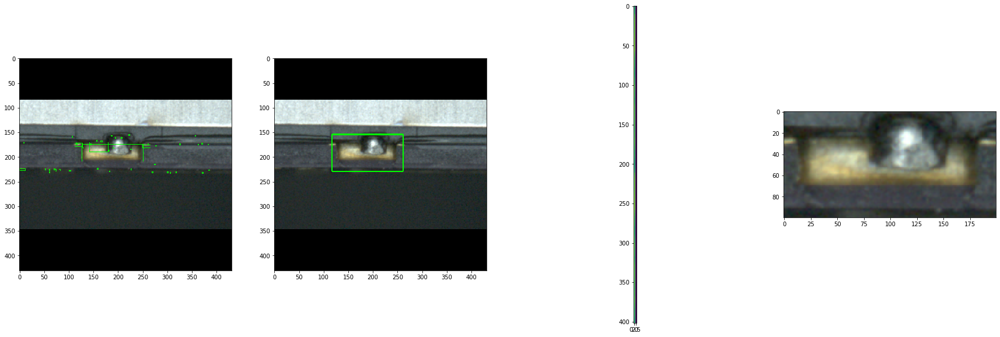

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
1
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_142721_650_Boat[_Col1_Row1]_Pos1.BMP
2
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_150211_49_Boat[_Col1_Row1]_Pos1.BMP
2
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_153238_267_Boat[_Col1_Row2]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


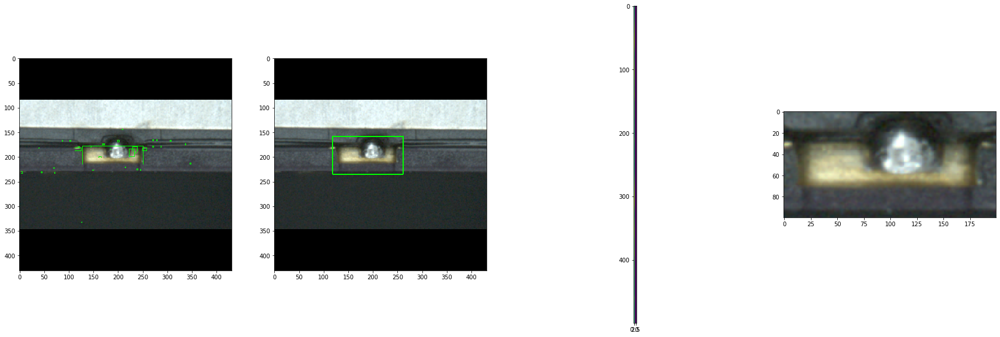

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
3
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_153238_267_Boat[_Col1_Row2]_Pos1.BMP
3
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_153711_461_Boat[_Col1_Row1]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


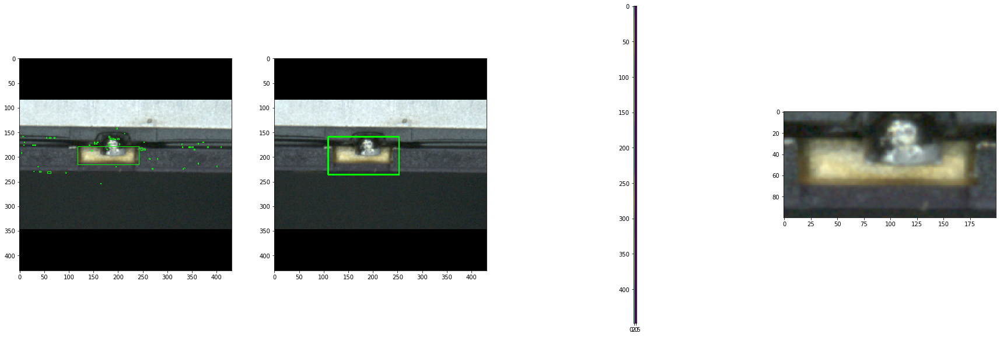

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
4
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_153711_461_Boat[_Col1_Row1]_Pos1.BMP
4
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_153714_255_Boat[_Col1_Row1]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


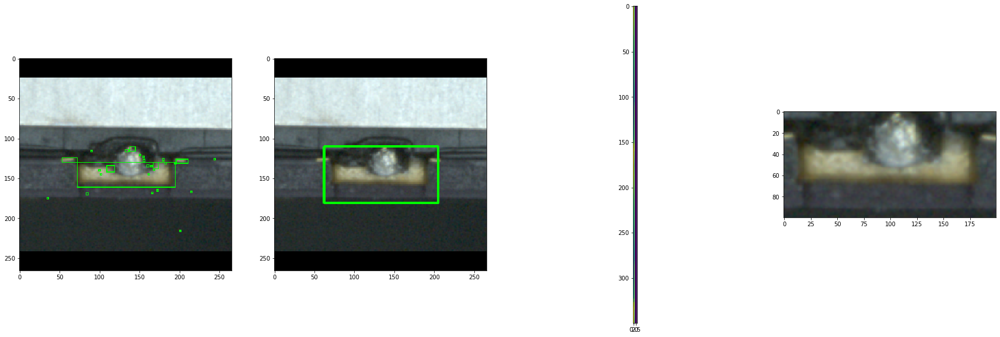

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
5
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_153714_255_Boat[_Col1_Row1]_Pos1.BMP
5
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_153720_627_Boat[_Col1_Row2]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


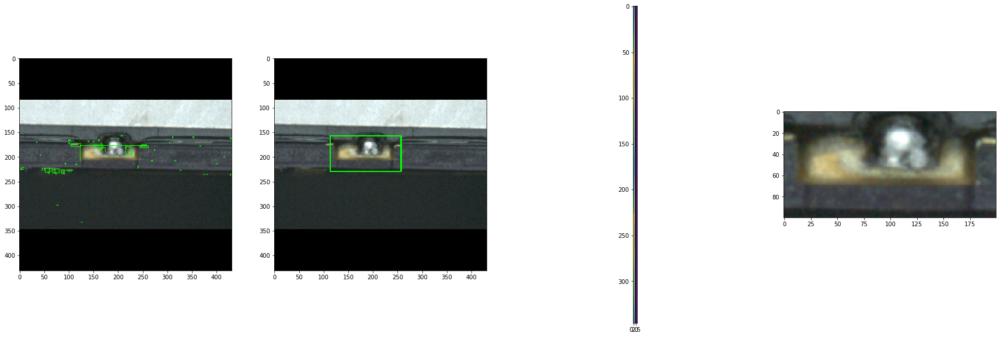

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
6
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_153720_627_Boat[_Col1_Row2]_Pos1.BMP
6
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_155258_863_Boat[_Col1_Row5]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


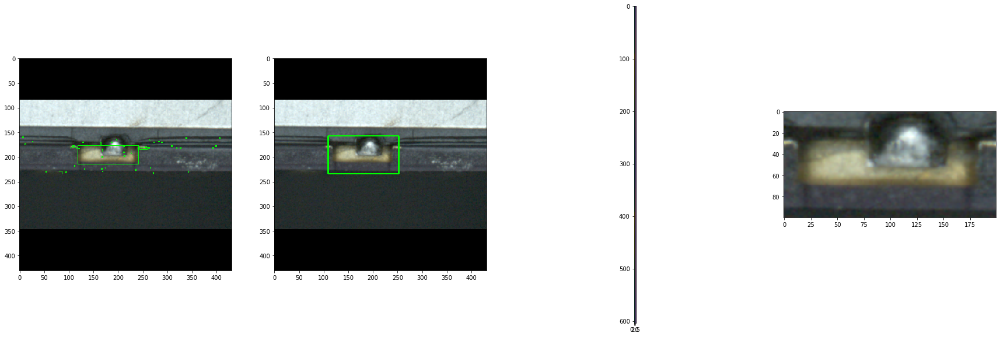

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
7
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_155258_863_Boat[_Col1_Row5]_Pos1.BMP
7
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_160151_981_Boat[_Col1_Row1]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


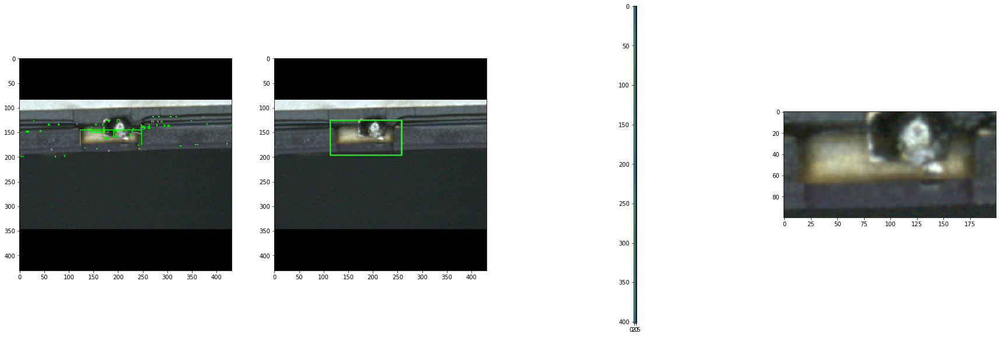

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
8
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_160151_981_Boat[_Col1_Row1]_Pos1.BMP
8
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_160409_682_Boat[_Col1_Row4]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


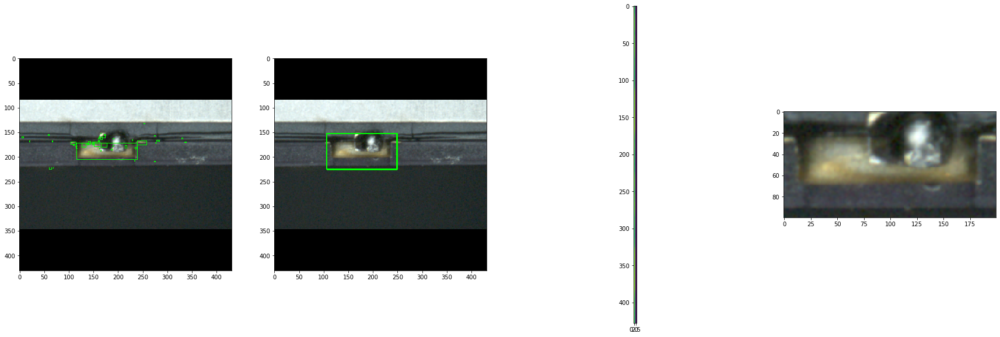

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
9
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_160409_682_Boat[_Col1_Row4]_Pos1.BMP
10
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_160503_314_Boat[_Col1_Row10]_Pos1.BMP
10
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_160508_36_Boat[_Col1_Row10]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


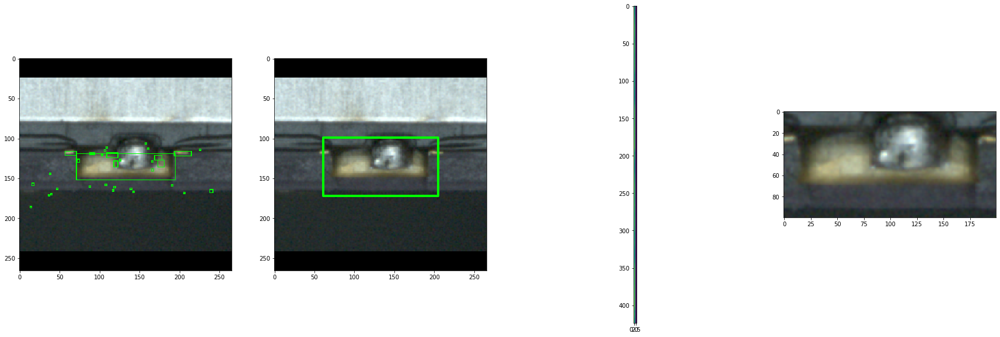

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
11
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_160508_36_Boat[_Col1_Row10]_Pos1.BMP
11
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_163833_707_Boat[_Col1_Row1]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


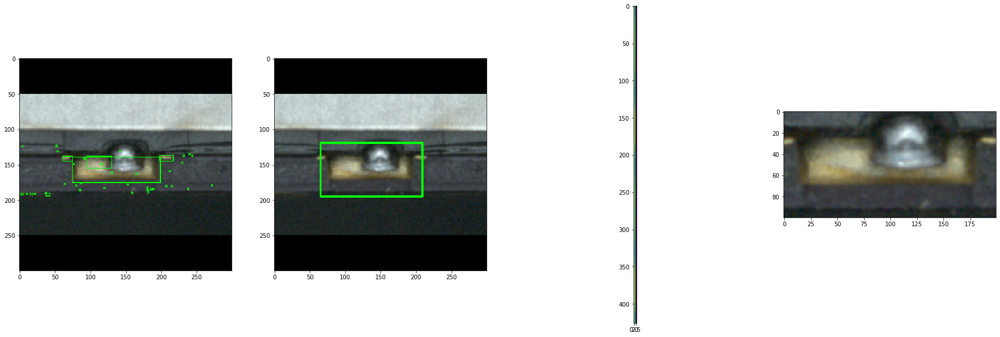

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
12
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_163833_707_Boat[_Col1_Row1]_Pos1.BMP
13
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_164537_450_Boat[_Col1_Row2]_Pos1.BMP
13
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_165145_535_Boat[_Col1_Row3]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


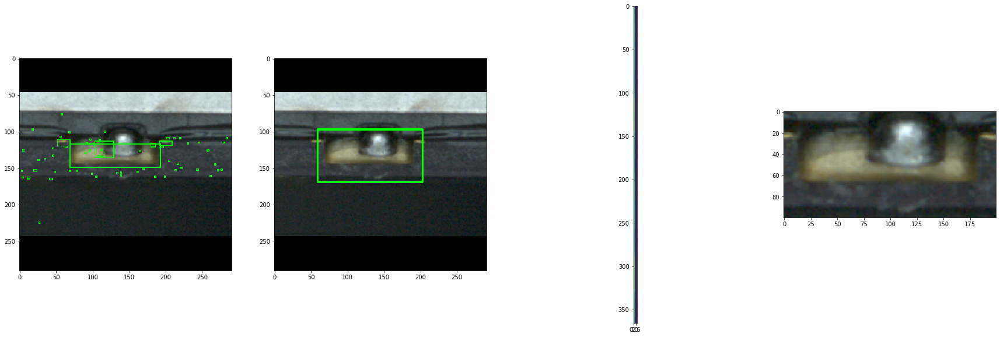

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
14
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_165145_535_Boat[_Col1_Row3]_Pos1.BMP
14
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_165148_37_Boat[_Col1_Row5]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


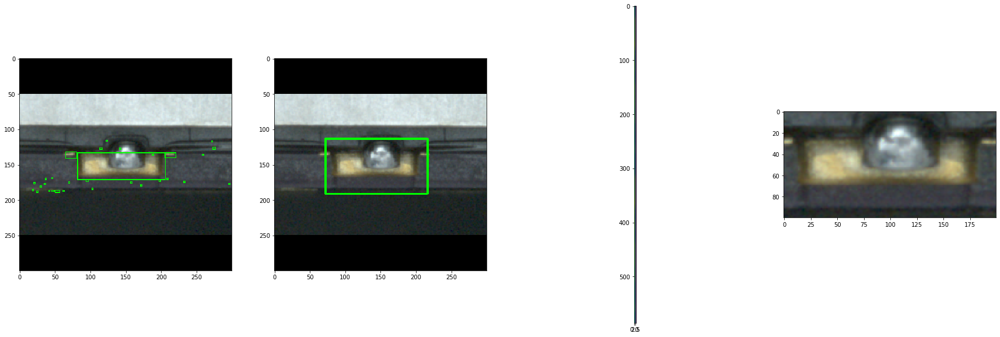

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
15
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_165148_37_Boat[_Col1_Row5]_Pos1.BMP
16
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_165202_878_Boat[_Col1_Row5]_Pos1.BMP
16
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_170111_820_Boat[_Col1_Row1]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


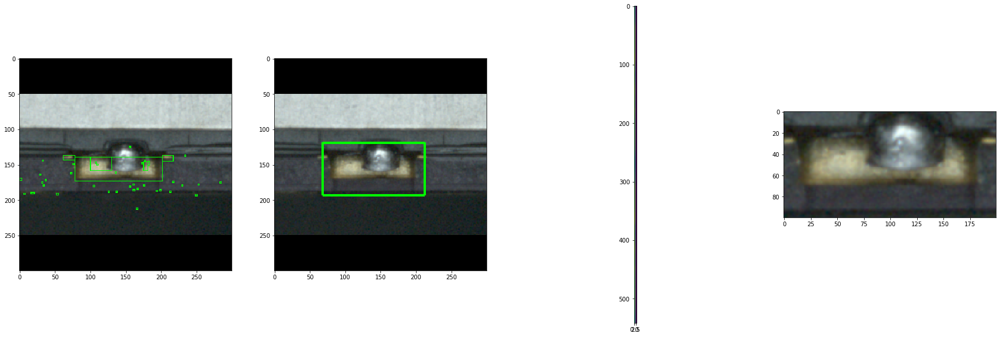

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
17
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_170111_820_Boat[_Col1_Row1]_Pos1.BMP
18
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_170114_214_Boat[_Col1_Row1]_Pos1.BMP
18
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_170120_643_Boat[_Col1_Row2]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


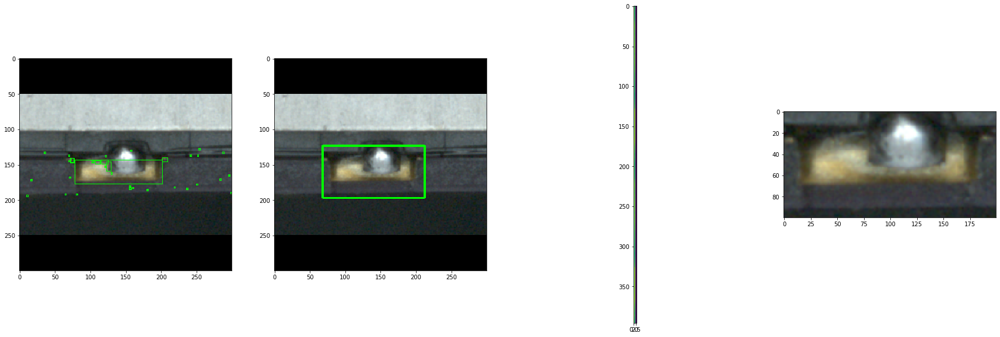

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
19
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_170120_643_Boat[_Col1_Row2]_Pos1.BMP
20
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_170615_69_Boat[_Col1_Row6]_Pos1.BMP
20
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_170951_758_Boat[_Col1_Row9]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


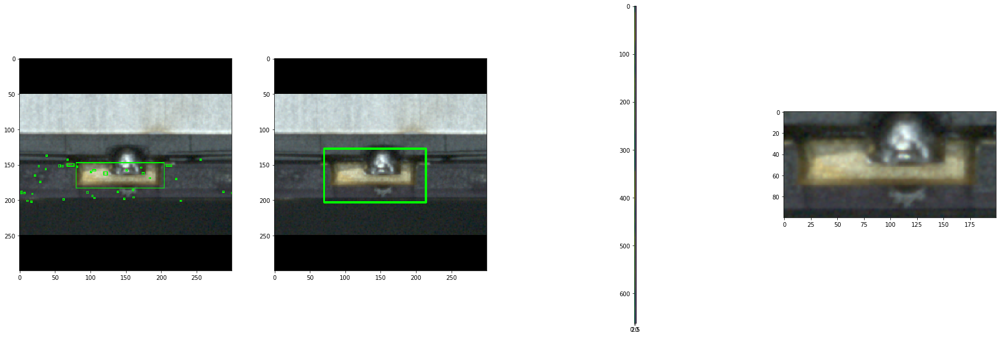

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
21
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_170951_758_Boat[_Col1_Row9]_Pos1.BMP
21
img2\NG\all\UP\POS1\Ng_CAM_UP_POS1_20190723_170134_322_Boat[_Col1_Row4]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


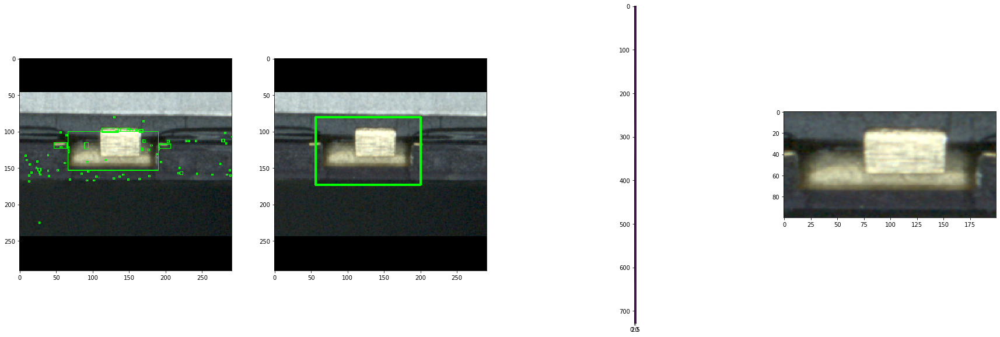

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
22
img2\NG\all\UP\POS1\Ng_CAM_UP_POS1_20190723_170134_322_Boat[_Col1_Row4]_Pos1.BMP
23
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_145831_883_Boat[_Col1_Row1]_Pos2.BMP
23
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_150025_781_Boat[_Col1_Row1]_Pos2.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


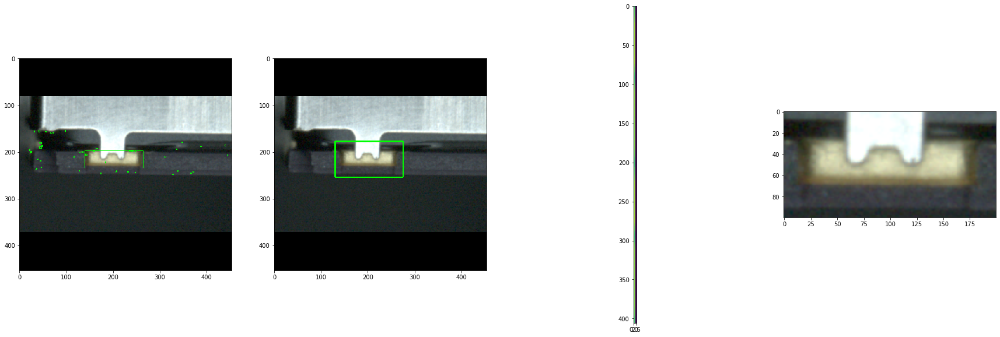

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
24
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_150025_781_Boat[_Col1_Row1]_Pos2.BMP
25
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_153238_860_Boat[_Col1_Row2]_Pos2.BMP
26
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_160156_985_Boat[_Col1_Row1]_Pos2.BMP
27
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_160410_254_Boat[_Col1_Row4]_Pos2.BMP
28
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_160414_360_Boat[_Col1_Row4]_Pos2.BMP
29
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_160424_726_Boat[_Col1_Row5]_Pos2.BMP
30
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_160440_842_Boat[_Col1_Row7]_Pos2.BMP
31
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_160445_870_Boat[_Col1_Row7]_Pos2.BMP
31
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_160458_163_Boat[_Col1_Row9]_Pos2.BMP
oooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo

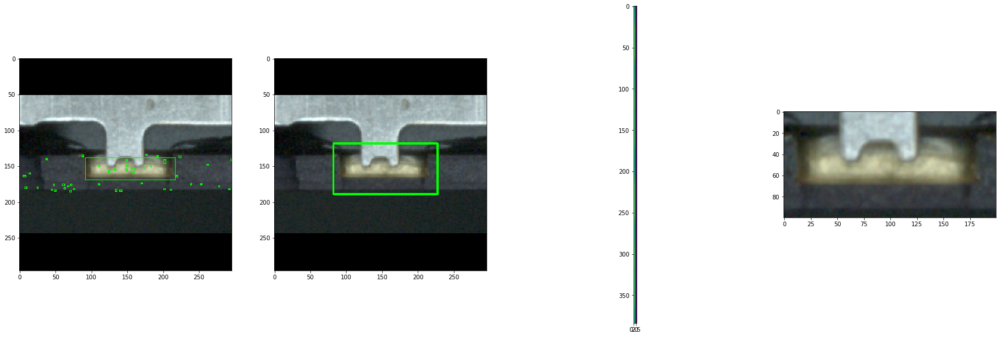

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
32
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_160458_163_Boat[_Col1_Row9]_Pos2.BMP
32
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_165146_33_Boat[_Col1_Row3]_Pos2.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


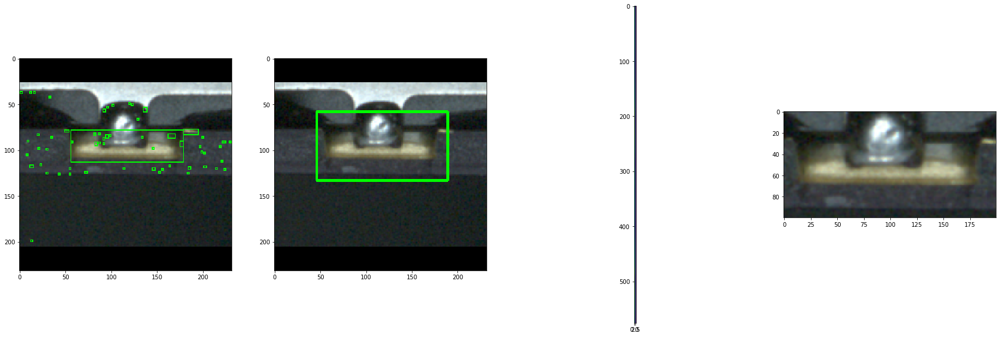

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
33
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_165146_33_Boat[_Col1_Row3]_Pos2.BMP
34
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_170114_771_Boat[_Col1_Row1]_Pos2.BMP
34
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_170615_691_Boat[_Col1_Row6]_Pos2.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


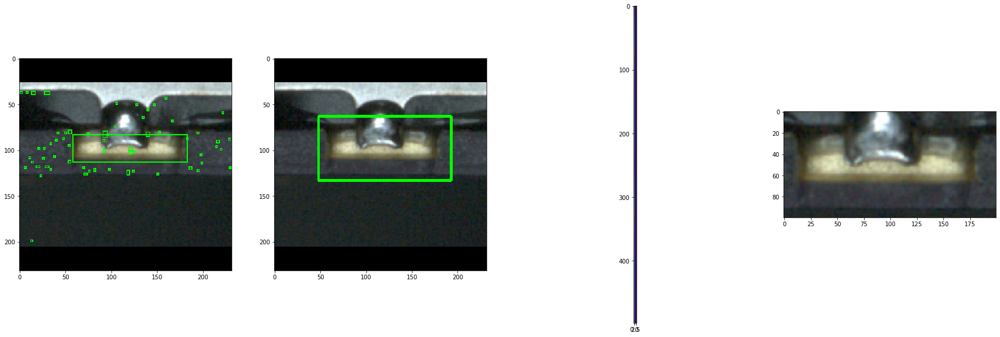

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
35
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_170615_691_Boat[_Col1_Row6]_Pos2.BMP
36
img2\NG\all\UP\POS2\Ng_CAM_UP_POS2_20190723_153712_116_Boat[_Col1_Row1]_Pos2.BMP
37
img2\NG\all\UP\POS2\Ng_CAM_UP_POS2_20190723_155243_425_Boat[_Col1_Row2]_Pos2.BMP
38
img2\NG\all\UP\POS2\Ng_CAM_UP_POS2_20190723_155248_863_Boat[_Col1_Row4]_Pos2.BMP
39
img2\NG\all\UP\POS2\Ng_CAM_UP_POS2_20190723_155259_447_Boat[_Col1_Row5]_Pos2.BMP
39
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_140705_791_Boat[_Col1_Row2]_Pos3.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


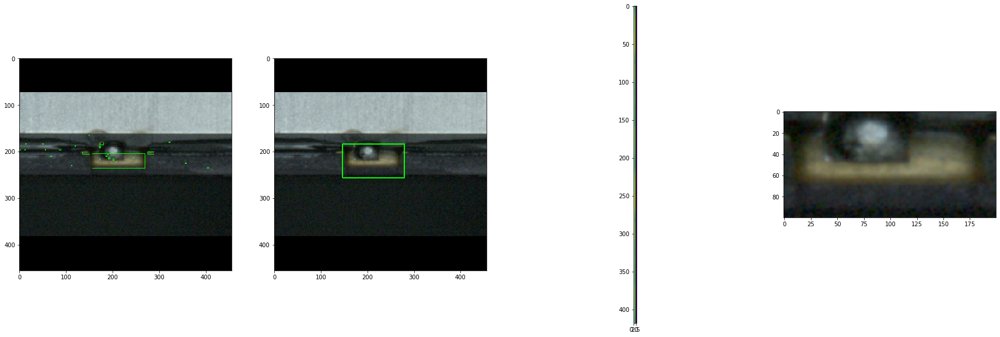

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
40
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_140705_791_Boat[_Col1_Row2]_Pos3.BMP
41
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_142722_798_Boat[_Col1_Row1]_Pos3.BMP
42
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_153248_563_Boat[_Col1_Row3]_Pos3.BMP
43
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_153712_695_Boat[_Col1_Row1]_Pos3.BMP
44
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_153721_945_Boat[_Col1_Row2]_Pos3.BMP
44
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_155249_475_Boat[_Col1_Row4]_Pos3.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


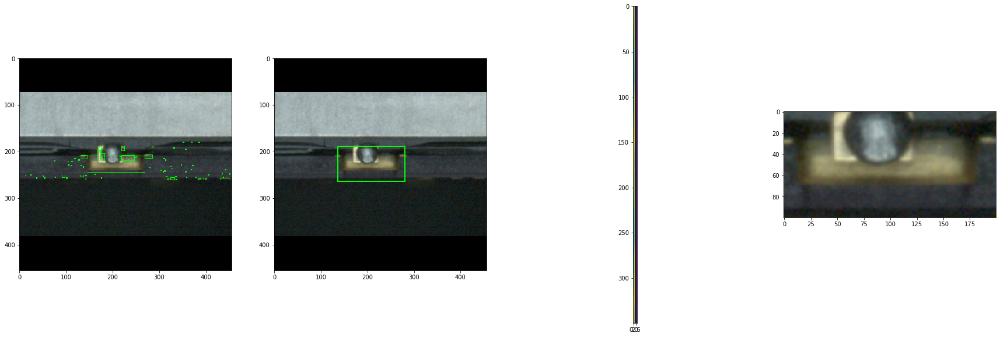

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
45
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_155249_475_Boat[_Col1_Row4]_Pos3.BMP
45
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_155310_222_Boat[_Col1_Row6]_Pos3.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


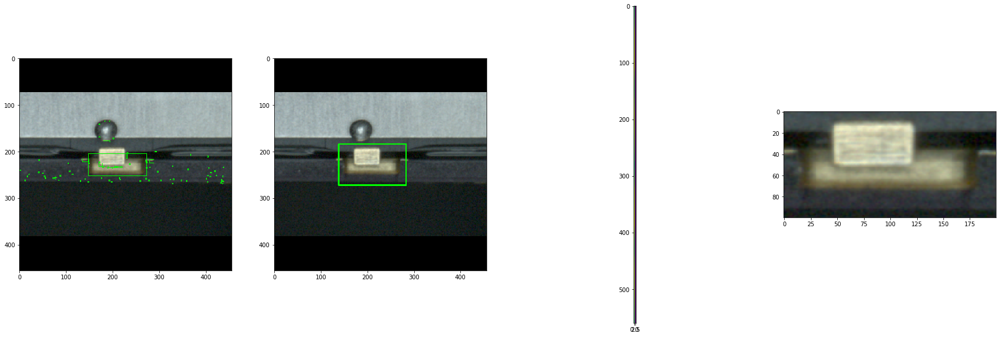

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
46
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_155310_222_Boat[_Col1_Row6]_Pos3.BMP
47
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_155857_381_Boat[_Col1_Row9]_Pos3.BMP
47
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_160431_521_Boat[_Col1_Row6]_Pos3.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


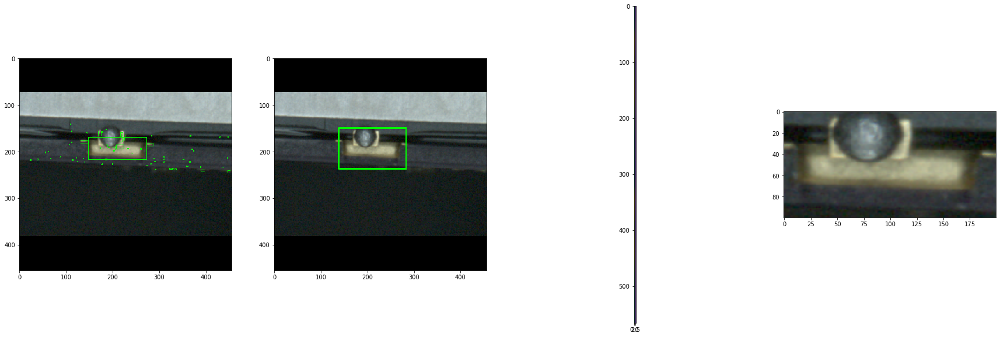

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
48
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_160431_521_Boat[_Col1_Row6]_Pos3.BMP
49
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_160451_887_Boat[_Col1_Row8]_Pos3.BMP
49
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_161343_14_Boat[_Col1_Row1]_Pos3.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


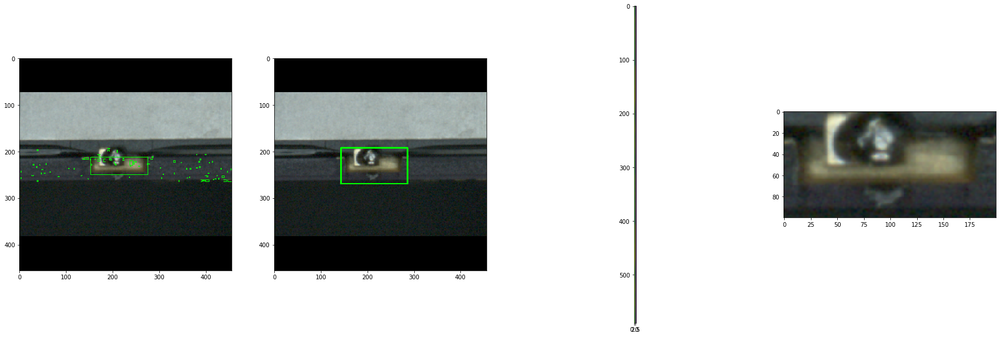

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
50
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_161343_14_Boat[_Col1_Row1]_Pos3.BMP
50
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_165155_457_Boat[_Col1_Row4]_Pos3.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


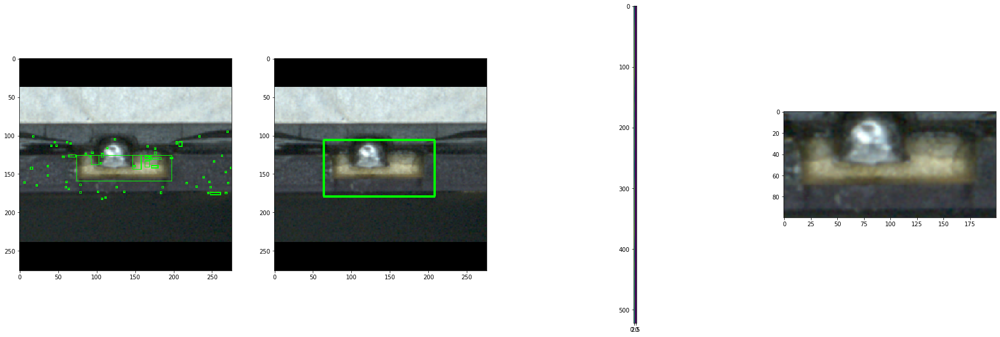

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
51
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_165155_457_Boat[_Col1_Row4]_Pos3.BMP
52
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_170616_214_Boat[_Col1_Row6]_Pos3.BMP
52
img2\NG\all\UP\POS3\Ng_CAM_UP_POS3_20190723_155237_536_Boat[_Col1_Row2]_Pos3.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


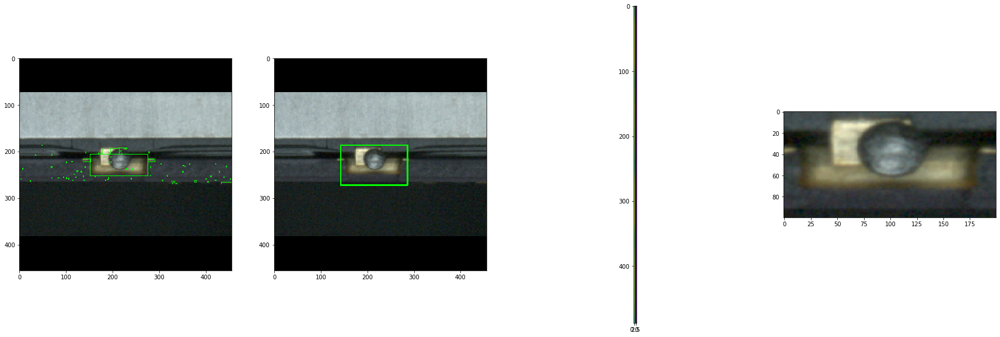

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
53
img2\NG\all\UP\POS3\Ng_CAM_UP_POS3_20190723_155237_536_Boat[_Col1_Row2]_Pos3.BMP
53
img2\NG\all\UP\POS3\Ng_CAM_UP_POS3_20190723_160441_432_Boat[_Col1_Row7]_Pos3.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


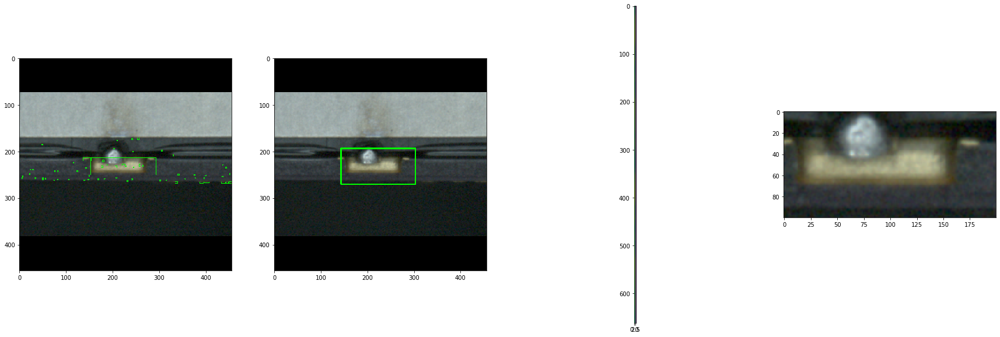

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
54
img2\NG\all\UP\POS3\Ng_CAM_UP_POS3_20190723_160441_432_Boat[_Col1_Row7]_Pos3.BMP
55
img2\NG\all\UP\POS3\Ng_CAM_UP_POS3_20190723_163834_875_Boat[_Col1_Row1]_Pos3.BMP
56
img2\NG\all\UP\POS3\Ng_CAM_UP_POS3_20190723_165146_663_Boat[_Col1_Row3]_Pos3.BMP
56
img2\NG\all\UP\POS3\Ng_CAM_UP_POS3_20190723_165204_91_Boat[_Col1_Row5]_Pos3.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


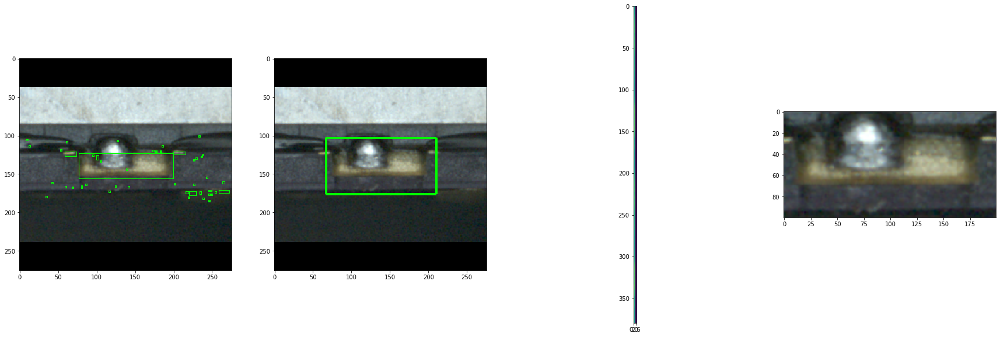

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
57
img2\NG\all\UP\POS3\Ng_CAM_UP_POS3_20190723_165204_91_Boat[_Col1_Row5]_Pos3.BMP
57
img2\NG\all\UP\POS3\Ng_CAM_UP_POS3_20190723_170113_37_Boat[_Col1_Row1]_Pos3.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


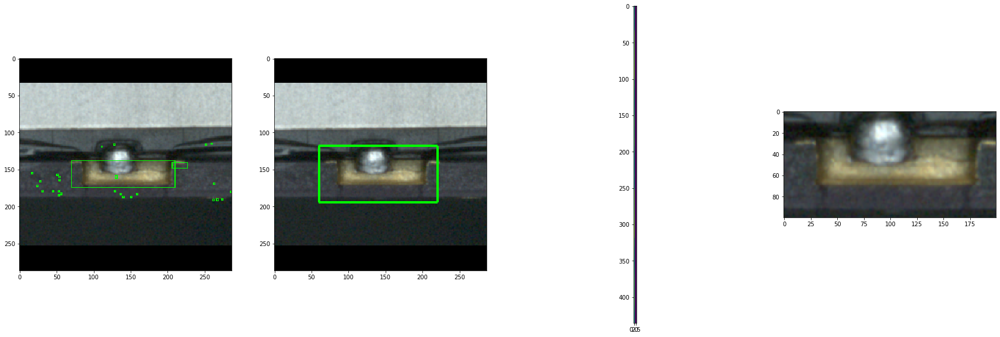

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
58
img2\NG\all\UP\POS3\Ng_CAM_UP_POS3_20190723_170113_37_Boat[_Col1_Row1]_Pos3.BMP


In [16]:
img_up_ng_det = detection_y(up_ng, path_list_up_ng)

# 3. Modeling

In [17]:
#up_ng_det.shape, up_ok_det.shape

In [17]:
img_up_ok_det.shape, img_up_ng_det.shape

((1440, 100, 200, 3), (58, 100, 200, 3))

In [ ]:
Z_ng_det.shape, Z_ok_det.shape

In [17]:
#insp_ng_mini.shape, insp_ok_mini.shape

In [ ]:
X = np.concatenate((Z_ng_det, Z_ok_det))
y = np.concatenate((np.ones(len(Z_ng_det)), np.zeros(len(Z_ok_det))))

In [100]:
# X = np.concatenate((up_ng_det, up_ok_det))
# y = np.concatenate((np.ones(len(up_ng_det)), np.zeros(len(up_ok_det))))

In [ ]:
# X = np.concatenate((insp_ng_mini, insp_ok_mini))
# y = np.concatenate((np.ones(len(insp_ng_mini)), np.zeros(len(insp_ok_mini))))

In [18]:
X = np.concatenate((img_up_ng_det, img_up_ok_det))
y = np.concatenate((np.ones(len(img_up_ng_det)), np.zeros(len(img_up_ok_det))))

In [19]:
X.shape, y.shape

((1498, 100, 200, 3), (1498,))

In [20]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, stratify=y, random_state=77)

In [21]:
from keras import optimizers, metrics
from keras.layers import Input, Dense, Conv2D, Activation, GlobalAveragePooling2D, Flatten, concatenate
from keras.layers import Dropout, BatchNormalization, MaxPooling2D, Lambda
from keras.models import Model, Input
from keras.models import load_model
from keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from keras.utils import np_utils
from keras.applications.vgg16 import VGG16
from keras.applications.mobilenetv2 import MobileNetV2
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import multi_gpu_model


In [22]:
from keras.utils.vis_utils import plot_model
import pydot as pyd
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot

In [28]:
x_input = Input(shape=(100, 200, 3))

x = Conv2D(32, (3, 3), padding='same')(x_input)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Conv2D(32, (3, 3), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = MaxPooling2D()(x)

x = Conv2D(64, (3, 3), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Conv2D(64, (3, 3), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = GlobalAveragePooling2D()(x)

x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(512, activation='relu')(x)
x_output = Dense(1, activation='sigmoid')(x)

model = Model(inputs=x_input, outputs=x_output)








Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [29]:
plot_model(model, to_file='model_plot_up_baseline_2.png', show_shapes=True, show_layer_names=True)

In [30]:
batch_size = 450
epochs = 100

## Baseline

### 1

#### Train Model

In [ ]:
sgd = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.9, nesterov=True)
adam = optimizers.Adam(lr=0.001, decay=1e-6)
#model = multi_gpu_model(model, gpus=2)
model.compile(loss = "binary_crossentropy", optimizer=adam, metrics=["acc"])

callbacks = [ReduceLROnPlateau(patience=100, factor=0.5, verbose=1),
             #EarlyStopping(patience=100, verbose=1),
             ModelCheckpoint("best_up_model_try.h5", save_best_only=True, verbose=1)]

hist = model.fit(X_train, y_train, validation_data=[X_test, y_test],
          batch_size=batch_size, epochs=epochs, callbacks=callbacks)

In [ ]:
model.load_weights("best_model_try.h5")

In [ ]:
train_pred = model.predict(X_train)
train_pred[train_pred<0.5] = 0
train_pred[train_pred>=0.5] = 1

#### Predict Train

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_train, train_pred.reshape(-1)))

In [ ]:
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_train, train_pred))

#### Predict Test

In [ ]:
pred = model.predict(X_test)
pred[pred<0.5] = 0
pred[pred>=0.5] = 1

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(y_test, pred.reshape(-1)))

In [ ]:
print(confusion_matrix(y_test, pred))

### 2 `(Accuracy 100%)`

#### Train Model

In [23]:
import keras
import tensorflow as tf

In [ ]:
sgd = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.9, nesterov=True)
adam = optimizers.Adam(lr=0.0005, decay=1e-6)
#model = multi_gpu_model(model, gpus=2)
model.compile(loss = "binary_crossentropy", optimizer=adam, metrics=["acc"])

callbacks = [ReduceLROnPlateau(patience=10, factor=0.5, verbose=1),
             #EarlyStopping(patience=100, verbose=1),
             ModelCheckpoint("best_model_baseline_2.h5", save_best_only=True, verbose=1)]

keras.backend.get_session().run(tf.global_variables_initializer())

In [ ]:
hist = model.fit(X_train, y_train, validation_data=[X_test, y_test],
                 batch_size=batch_size, epochs=epochs, callbacks=callbacks)

In [ ]:
# save model
model_json = model.to_json()
with open("best_model_baseline_2.json", "w") as f:
    f.write(model_json)

json.dump(str(hist), open("best_model_baseline_2.json", 'w'))

In [ ]:
model.load_weights("best_model_baseline_2.h5")

#### Predict Train

In [ ]:
train_pred = model.predict(X_train)
train_pred[train_pred<0.5] = 0
train_pred[train_pred>=0.5] = 1

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(y_train, train_pred.reshape(-1)))

In [ ]:
print(confusion_matrix(y_train, train_pred))

#### Predict Test

In [ ]:
pred = model.predict(X_test)
pred[pred<0.5] = 0
pred[pred>=0.5] = 1

In [ ]:
print(classification_report(y_test, pred.reshape(-1)))

In [ ]:
print(confusion_matrix(y_test, pred))

#### Plot

In [ ]:
plt.figure(figsize=(20,5.5))
from sklearn.metrics import accuracy_score
from sklearn import metrics

# acc plot
train_acc = accuracy_score(y_train, train_pred)
test_acc = accuracy_score(y_test, pred)

plt.subplot(131)
plt.plot(hist.history['acc'], color="royalblue")
plt.plot(hist.history['val_acc'], color="salmon")
plt.title('model acc')
plt.ylabel('acc')
plt.xlabel('epoch')
plt.legend(['train='+str(train_acc), 'test='+str(test_acc)], loc=4)

# loss plot
plt.subplot(132)
plt.plot(hist.history['loss'], color="royalblue")
plt.plot(hist.history['val_loss'], color="salmon")
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc=1)

# ROC Curve
train_fpr, train_tpr, _ = metrics.roc_curve(y_train,  train_pred)
test_fpr, test_tpr, _ = metrics.roc_curve(y_test,  pred)
train_auc = metrics.roc_auc_score(y_train, train_pred)
test_auc = metrics.roc_auc_score(y_test, pred)

plt.subplot(133)
plt.plot(test_fpr, test_tpr, color="salmon")
plt.plot(train_fpr, train_tpr, color="royalblue")
plt.legend(['train='+str(train_auc), 'test='+str(test_auc)],loc=4)
plt.title('ROC Curve')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

plt.show()

In [ ]:
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot

%matplotlib inline

SVG(model_to_dot(model, show_shapes=True).create(prog='dot', format='svg'))

## Mobilenet

In [30]:
base_model_mbv2 =MobileNetV2(weights=None,include_top=False) #imports the MobileNetV2 model and discards the last 1000 neuron layer.
x=base_model_mbv2.output
x=GlobalAveragePooling2D()(x)
x=Dense(2048,activation='relu')(x) #we add dense layers so that the model can learn more complex functions and classify for better results.
x = Dropout(0.5)(x)
x=Dense(1024,activation='relu')(x) #dense layer 2
x=Dense(1024,activation='relu')(x) #dense layer 2
x = Dropout(0.5)(x)
x=Dense(512,activation='relu')(x) #dense layer 3
preds=Dense(1,activation='sigmoid')(x) #final layer with softmax activation for N classes

model_mbv2 =Model(inputs=base_model_mbv2.input,outputs=preds) #specify the inputs and outputs

In [31]:
for layer in model_mbv2.layers[:20]:
    layer.trainable=False
for layer in model_mbv2.layers[20:]:
    layer.trainable=True

In [32]:
model_mbv2.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_3[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, None, None, 3 864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, None, None, 3 128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu

In [33]:
sgd = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.9, nesterov=True)
adam = optimizers.Adam(lr=0.0005, decay=1e-6)
model_mbv2.compile(loss = "binary_crossentropy", optimizer=adam, metrics=["acc"])
# step_size_train=train_generator.n//train_generator.batch_size
# step_size_val=val_generator.n//val_generator.batch_size
# model.fit_generator(generator=train_generator,
#                   steps_per_epoch=step_size_train,
#                   epochs=100, validation_data=val_generator,
#                   validation_steps=step_size_val)


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [ ]:
plot_model(model_mbv2, to_file='model_plotmodel_mbv2.png', show_shapes=True, show_layer_names=True)

In [34]:
batch_size = 450
epochs = 10

In [35]:
callbacks = [ReduceLROnPlateau(patience=10, factor=0.5, verbose=1),
             #EarlyStopping(patience=100, verbose=1),
             ModelCheckpoint("best_model_mobilenetv2.h5", save_best_only=True, verbose=1)]

keras.backend.get_session().run(tf.global_variables_initializer())
hist = model_mbv2.fit(X_train, y_train, validation_data=[X_test, y_test],
                 batch_size=batch_size, epochs=epochs, callbacks=callbacks)

Train on 1348 samples, validate on 150 samples
Epoch 1/10
1348/1348 [==============================] - 120s 89ms/step - loss: 0.3970 - acc: 0.7240 - val_loss: 0.1774 - val_acc: 0.9600

Epoch 00001: val_loss improved from inf to 0.17741, saving model to best_model_mobilenetv2.h5
Epoch 2/10
1348/1348 [==============================] - 115s 85ms/step - loss: 0.1617 - acc: 0.9614 - val_loss: 0.3903 - val_acc: 0.9600

Epoch 00002: val_loss did not improve from 0.17741
Epoch 3/10
1348/1348 [==============================] - 117s 87ms/step - loss: 0.1095 - acc: 0.9614 - val_loss: 0.3815 - val_acc: 0.9600

Epoch 00003: val_loss did not improve from 0.17741
Epoch 4/10
1348/1348 [==============================] - 121s 89ms/step - loss: 0.0764 - acc: 0.9614 - val_loss: 0.4041 - val_acc: 0.9600

Epoch 00004: val_loss did not improve from 0.17741
Epoch 5/10
1348/1348 [==============================] - 118s 88ms/step - loss: 0.0507 - acc: 0.9614 - val_loss: 0.5687 - val_acc: 0.9600

Epoch 00005: val

In [36]:
model_mbv2.load_weights("best_model_mobilenetv2.h5")

In [37]:
train_pred = model_mbv2.predict(X_train)
train_pred[train_pred<0.5] = 0
train_pred[train_pred>=0.5] = 1

In [38]:
from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(y_train, train_pred.reshape(-1)))

              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98      1296
         1.0       0.00      0.00      0.00        52

    accuracy                           0.96      1348
   macro avg       0.48      0.50      0.49      1348
weighted avg       0.92      0.96      0.94      1348



C:\Python\Python37\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [39]:
print(confusion_matrix(y_train, train_pred))

[[1296    0]
 [  52    0]]


#### Predict Test

In [40]:
pred = model_mbv2.predict(X_test)
pred[pred<0.5] = 0
pred[pred>=0.5] = 1

In [41]:
print(classification_report(y_test, pred.reshape(-1)))

              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98       144
         1.0       0.00      0.00      0.00         6

    accuracy                           0.96       150
   macro avg       0.48      0.50      0.49       150
weighted avg       0.92      0.96      0.94       150



In [42]:
print(confusion_matrix(y_test, pred))

[[144   0]
 [  6   0]]


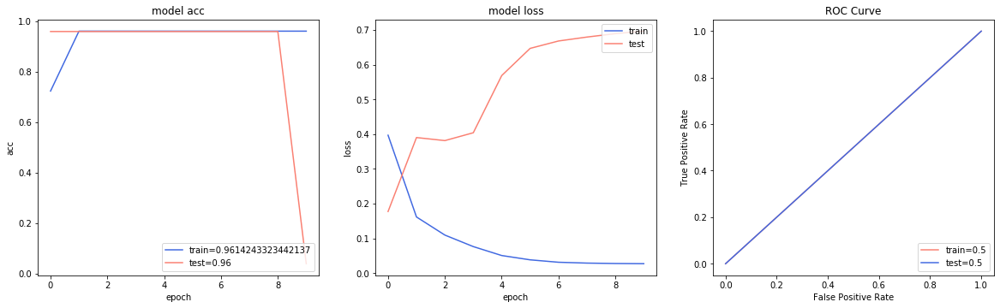

In [43]:
plt.figure(figsize=(20,5.5))
from sklearn.metrics import accuracy_score
from sklearn import metrics

# acc plot
train_acc = accuracy_score(y_train, train_pred)
test_acc = accuracy_score(y_test, pred)

plt.subplot(131)
plt.plot(hist.history['acc'], color="royalblue")
plt.plot(hist.history['val_acc'], color="salmon")
plt.title('model acc')
plt.ylabel('acc')
plt.xlabel('epoch')
plt.legend(['train='+str(train_acc), 'test='+str(test_acc)], loc=4)

# loss plot
plt.subplot(132)
plt.plot(hist.history['loss'], color="royalblue")
plt.plot(hist.history['val_loss'], color="salmon")
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc=1)

# ROC Curve
train_fpr, train_tpr, _ = metrics.roc_curve(y_train,  train_pred)
test_fpr, test_tpr, _ = metrics.roc_curve(y_test,  pred)
train_auc = metrics.roc_auc_score(y_train, train_pred)
test_auc = metrics.roc_auc_score(y_test, pred)

plt.subplot(133)
plt.plot(test_fpr, test_tpr, color="salmon")
plt.plot(train_fpr, train_tpr, color="royalblue")
plt.legend(['train='+str(train_auc), 'test='+str(test_auc)],loc=4)
plt.title('ROC Curve')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

plt.show()

# VGG16

In [ ]:
base_model_vgg16 =VGG16(weights=None,include_top=False) #imports the MobileNetV2 model and discards the last 1000 neuron layer.
x=base_model_vgg16.output
x=GlobalAveragePooling2D()(x)
x=Dense(2048,activation='relu')(x) #we add dense layers so that the model can learn more complex functions and classify for better results.
x = Dropout(0.5)(x)
x=Dense(1024,activation='relu')(x) #dense layer 2
x=Dense(1024,activation='relu')(x) #dense layer 2
x = Dropout(0.5)(x)
x=Dense(512,activation='relu')(x) #dense layer 3
preds=Dense(1,activation='sigmoid')(x) #final layer with softmax activation for N classes

model_vgg16 =Model(inputs=base_model_vgg16.input,outputs=preds) #specify the inputs and outputs

In [45]:
model_vgg16.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0         
__________

In [46]:
sgd = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.9, nesterov=True)
adam = optimizers.Adam(lr=0.0005, decay=1e-6)
#model = multi_gpu_model(model, gpus=2)
model_vgg16.compile(loss = "binary_crossentropy", optimizer=adam, metrics=["acc"])
# step_size_train=train_generator.n//train_generator.batch_size
# step_size_val=val_generator.n//val_generator.batch_size
# model.fit_generator(generator=train_generator,
#                   steps_per_epoch=step_size_train,
#                   epochs=100, validation_data=val_generator,
#                   validation_steps=step_size_val)

In [57]:
plot_model(model_vgg16, to_file='model_plot_model_vgg16.png', show_shapes=True, show_layer_names=True)

In [47]:
batch_size = 450
epochs = 10

In [48]:
callbacks = [ReduceLROnPlateau(patience=10, factor=0.5, verbose=1),
             #EarlyStopping(patience=100, verbose=1),
             ModelCheckpoint("best_model_vgg16.h5", save_best_only=True, verbose=1)]

keras.backend.get_session().run(tf.global_variables_initializer())
hist = model_vgg16.fit(X_train, y_train, validation_data=[X_test, y_test],
                 batch_size=batch_size, epochs=epochs, callbacks=callbacks)

Train on 1348 samples, validate on 150 samples
Epoch 1/10
1348/1348 [==============================] - 179s 133ms/step - loss: 0.6839 - acc: 0.7715 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00001: val_loss improved from inf to 0.64472, saving model to best_model_vgg16.h5
Epoch 2/10
1348/1348 [==============================] - 164s 122ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00002: val_loss did not improve from 0.64472
Epoch 3/10
1348/1348 [==============================] - 163s 121ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00003: val_loss did not improve from 0.64472
Epoch 4/10
1348/1348 [==============================] - 166s 123ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00004: val_loss did not improve from 0.64472
Epoch 5/10
1348/1348 [==============================] - 164s 122ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00005: val_

In [49]:
model_vgg16.load_weights("best_model_vgg16.h5")

In [50]:
train_pred = model_vgg16.predict(X_train)
train_pred[train_pred<0.5] = 0
train_pred[train_pred>=0.5] = 1

In [51]:
from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(y_train, train_pred.reshape(-1)))

              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98      1296
         1.0       0.00      0.00      0.00        52

    accuracy                           0.96      1348
   macro avg       0.48      0.50      0.49      1348
weighted avg       0.92      0.96      0.94      1348



C:\Python\Python37\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [52]:
print(confusion_matrix(y_train, train_pred))

[[1296    0]
 [  52    0]]


#### Predict Test

In [53]:
pred = model_vgg16.predict(X_test)
pred[pred<0.5] = 0
pred[pred>=0.5] = 1

In [54]:
print(classification_report(y_test, pred.reshape(-1)))

              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98       144
         1.0       0.00      0.00      0.00         6

    accuracy                           0.96       150
   macro avg       0.48      0.50      0.49       150
weighted avg       0.92      0.96      0.94       150



In [55]:
print(confusion_matrix(y_test, pred))

[[144   0]
 [  6   0]]


In [ ]:
plt.figure(figsize=(20,5.5))
from sklearn.metrics import accuracy_score
from sklearn import metrics

# acc plot
train_acc = accuracy_score(y_train, train_pred)
test_acc = accuracy_score(y_test, pred)

plt.subplot(131)
plt.plot(hist.history['acc'], color="royalblue")
plt.plot(hist.history['val_acc'], color="salmon")
plt.title('model acc')
plt.ylabel('acc')
plt.xlabel('epoch')
plt.legend(['train='+str(train_acc), 'test='+str(test_acc)], loc=4)

# loss plot
plt.subplot(132)
plt.plot(hist.history['loss'], color="royalblue")
plt.plot(hist.history['val_loss'], color="salmon")
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc=1)

# ROC Curve
train_fpr, train_tpr, _ = metrics.roc_curve(y_train,  train_pred)
test_fpr, test_tpr, _ = metrics.roc_curve(y_test,  pred)
train_auc = metrics.roc_auc_score(y_train, train_pred)
test_auc = metrics.roc_auc_score(y_test, pred)

plt.subplot(133)
plt.plot(test_fpr, test_tpr, color="salmon")
plt.plot(train_fpr, train_tpr, color="royalblue")
plt.legend(['train='+str(train_auc), 'test='+str(test_auc)],loc=4)
plt.title('ROC Curve')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

plt.show()

# efficient_net

In [24]:
import tensorflow as tf
import tensorflow.python.keras.backend as K
import tensorflow.python.keras.layers as KL
import tensorflow.python.keras.models as KM

In [25]:
import numpy as np
from skimage.io import imread
import matplotlib.pyplot as plt

from keras.applications.imagenet_utils import decode_predictions
import efficientnet.keras as efn 
from efficientnet.keras import center_crop_and_resize, preprocess_input

import os

In [26]:
model3 = efn.EfficientNetB3(classes = 2, weights=None,include_top=True)
#model3 = efn.EfficientNetB3(weights='noisy-student')







Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [27]:
batch_size = 128
epochs = 5

In [ ]:
model3.layers.pop()
last = model3.output
last = Dense(512, activation='relu')(last)
x_output = Dense(1, activation='sigmoid')(last)
model3 = Model(model3.input, outputs=x_output)
sgd = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.9, nesterov=True)
adam = optimizers.Adam(lr=0.0005, decay=1e-6)
#model = multi_gpu_model(model, gpus=2)
model3.compile(loss = "binary_crossentropy", optimizer=adam, metrics=["acc"])
#model3.summary()
callbacks = [ReduceLROnPlateau(patience=10, factor=0.5, verbose=1),
             #EarlyStopping(patience=100, verbose=1),
             ModelCheckpoint("best_model_effi_2.h5", save_best_only=True, verbose=1)]


keras.backend.get_session().run(tf.global_variables_initializer())
hist = model3.fit(X_train, y_train, validation_data=[X_test, y_test],
                 batch_size=batch_size, epochs=epochs, callbacks=callbacks)

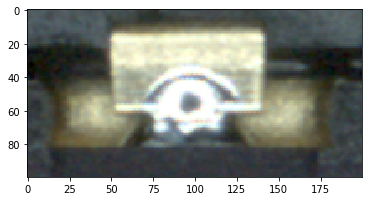

In [79]:
plt.imshow(X_train[0])

In [ ]:
pred_ylist = []
for i in range(0,len(X_train)):
    image_size = model3.input_shape[1] # 224
    x = center_crop_and_resize(X_train[i], image_size=image_size)
    x = preprocess_input(x)
    x = np.expand_dims(x, 0)
    y_list = model3.predict(x)
    pred_ylist.append(decode_predictions(y_list))
   
    
    
    

In [92]:
def inference(model, image):
    #image = imread(image_path)
    plt.figure(figsize=(10, 5))
    plt.subplot(1,3,1)
    plt.imshow(image)
    plt.title('original')
    image_size = model.input_shape[1] # 224
    cx = center_crop_and_resize(image, image_size=image_size)
    
    x = preprocess_input(cx)
    
    plt.subplot(1,3,2)
    plt.imshow(x)
    plt.title('preprocessing')
    
    x = np.expand_dims(x, 0)

    y = model.predict(x)
#     dy = decode_predictions(y)[0]
    
#     for idx, label, confidence in dy:
#          print('%s: %.2f%%' % (label, confidence * 100))

    if y < 0.5:
        print(y)    
        plt.subplot(1,3,3)
        plt.imshow(cx.astype(np.uint8))
        plt.title('center_crop')
        plt.show()

In [ ]:
for i in range(0,len(X_train)):
    inference(model3,X_train[i])


# ETC

In [ ]:
img_r = np.random.randint(0, 255, [10,10])
img_g = np.random.randint(0, 255, [10,10])
img_b = np.random.randint(0, 255, [10,10])
img_rgb = np.concatenate((img_r[...,np.newaxis], img_g[...,np.newaxis], img_b[...,np.newaxis]), axis=2)
                         
img_p = img_rgb.copy()
for r in img_p:
    for c in r:
        if 60 < c[0] < 200 and c[1] < 140 and c[2] > 170: # if yellow
            c[0] = 150
            c[1] = 100
            c[2] = 255
            
        else:
            c[0] = 0
            c[1] = 0
            c[2] = 0

plt.subplot(121)
plt.imshow(img_rgb)
plt.xticks([])
plt.yticks([])

plt.subplot(122)
plt.imshow(img_p)
plt.xticks([])
plt.yticks([])

plt.show()

In [ ]:
img_r = np.random.randint(0, 255, [10,10])
img_g = np.random.randint(0, 255, [10,10])
img_b = np.random.randint(0, 255, [10,10])
img_rgb = np.concatenate((tt_r[...,np.newaxis], tt_g[...,np.newaxis], tt_b[...,np.newaxis]), axis=2)
                         
img_y = img_rgb.copy()
for r in img_y:
    for c in r:
        if c[0] > 140 and c[1] > 140 and c[2] < 70: # if yellow
            c[0] = 255
            c[1] = 255
            c[2] = 0
            
        else:
            c[0] = 0
            c[1] = 0
            c[2] = 0

plt.subplot(121)
plt.imshow(img_rgb)
plt.xticks([])
plt.yticks([])

plt.subplot(122)
plt.imshow(img_y)
plt.xticks([])
plt.yticks([])

plt.show()

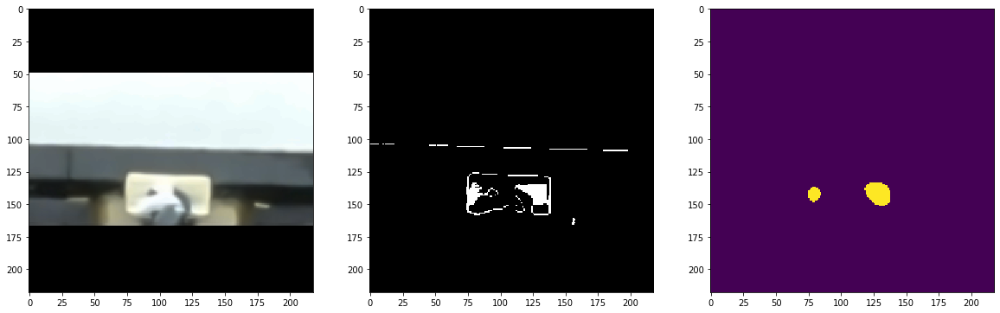

In [28]:
sqr_img = up_ok[117]
ttt = cv2.fastNlMeansDenoisingColored(sqr_img,None,9,9,7,11)
# ttt = sqr_img[1111]
for r in ttt:
    for c in r:
        if c[0] > 135 and c[1] > 180 and c[2] < 200: # if yellow
            c[0] = 255
            c[1] = 255
            c[2] = 255
            
        else:
            c[0] = 0
            c[1] = 0
            c[2] = 0
            
image_gray = cv2.cvtColor(np.float32(ttt), cv2.COLOR_BGR2GRAY)
kernel = np.ones((1, 1), np.uint8)
dilation_image = cv2.dilate(image_gray, kernel, iterations=1)
image_gray_blurred = cv2.GaussianBlur(dilation_image, (35, 35), 0)
_, thresh = cv2.threshold(image_gray_blurred, 100, 255, cv2.THRESH_BINARY)

plt.figure(figsize=(20,20))  

plt.subplot(131)
plt.imshow(cv2.fastNlMeansDenoisingColored(sqr_img,None,9,9,7,15))

plt.subplot(132)
plt.imshow(ttt)

plt.subplot(133)
plt.imshow(thresh)

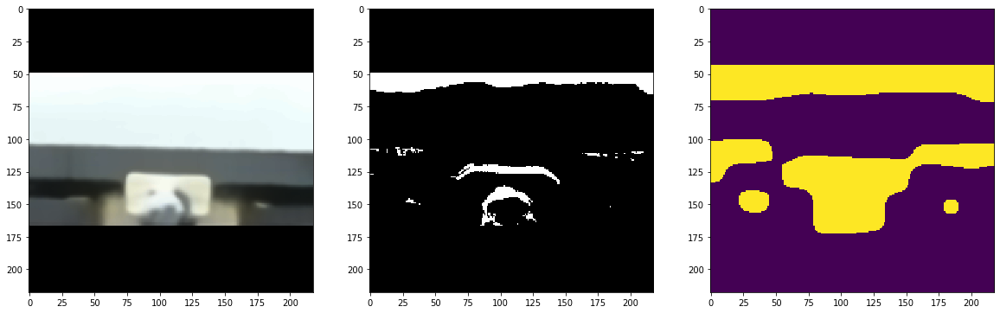

In [29]:
sqr_img = up_ok[117]
ttt = cv2.fastNlMeansDenoisingColored(sqr_img,None,9,9,7,17)
# ttt = sqr_img[1111]
for r in ttt:
    for c in r:
        if (np.max(c) - np.min(c)) < 8 and c[0] > 80: # if yellow
            c[0] = 255
            c[1] = 255
            c[2] = 255
            
        else:
            c[0] = 0
            c[1] = 0
            c[2] = 0
            
image_gray = cv2.cvtColor(np.float32(ttt), cv2.COLOR_BGR2GRAY)
kernel = np.ones((25, 25), np.uint8)
dilation_image = cv2.dilate(image_gray, kernel, iterations=1)
image_gray_blurred = cv2.GaussianBlur(dilation_image, (35, 35), 0)
_, thresh = cv2.threshold(image_gray_blurred, 220, 255, cv2.THRESH_BINARY)

plt.figure(figsize=(20,20))

plt.subplot(131)
plt.imshow(cv2.fastNlMeansDenoisingColored(sqr_img,None,17,17,7,25))

plt.subplot(132)
plt.imshow(ttt)

plt.subplot(133)
plt.imshow(thresh)

In [ ]:
sqr_img = up_ok[117]
test_img = cv2.cvtColor(sqr_img, cv2.COLOR_BGR2RGB)
pad = int(test_img.shape[0]*0.25)
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(test_img[pad:-pad, :, :])
plt.subplot(1,2,2)
plt.imshow(sqr_img)
np.mean(test_img)

In [ ]:
sqr_img = up_ok[117]
test_img = cv2.cvtColor(sqr_img, cv2.COLOR_BGR2RGB)
pad = int(test_img.shape[0]*0.25)
plt.imshow(test_img[pad:-pad, :, :])
np.mean(test_img)

In [ ]:
plt.imshow(cv2.fastNlMeansDenoisingColored(up_ok[117].copy(),None,11,11,7,17))

In [ ]:
sqr_img = up_ok[117]
test_img = sqr_img
pad = int(test_img.shape[0]*0.25)
test_img = test_img[pad:-pad, :, :]
mean = np.mean(test_img)
print(mean)
test_img = test_img.astype('float64')
for r in test_img:
    for c in r:
        c[c > 50] *= 1.4
        c[0] *= 1.2
        c[1] *= 1.2
        c[c > 255] = 255
        c[c <= 50] *= 1.1
test_img = test_img.astype('uint8')

plt.figure(figsize=(20,20))  

plt.subplot(121)
plt.imshow(test_img)
plt.subplot(122)
plt.imshow(sqr_img[pad:-pad, :, :])
print(np.mean(test_img))

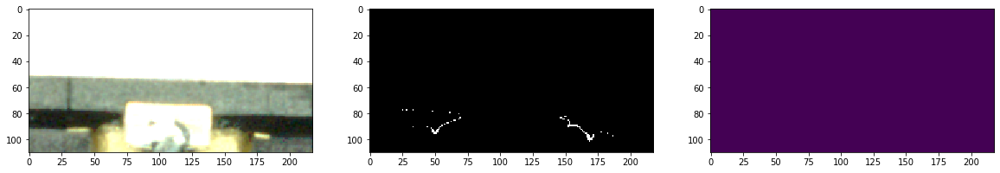

In [40]:
test_image = test_img.copy()
test_image = cv2.fastNlMeansDenoisingColored(test_image,None,11,11,7,21)
for r in test_image:
    for c in r:
        if c[0] > 40 and c[1] > 70 and c[2] < 60: # if yellow
            c[0] = 255
            c[1] = 255
            c[2] = 255
            
        else:
            c[0] = 0
            c[1] = 0
            c[2] = 0
            
image_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)
kernel = np.ones((1, 1), np.uint8)
dilation_image = cv2.dilate(image_gray, kernel, iterations=1)
image_gray_blurred = cv2.GaussianBlur(dilation_image, (35, 35), 0)
_, thresh = cv2.threshold(image_gray_blurred, 100, 255, cv2.THRESH_BINARY)

plt.figure(figsize=(20,20)) 

plt.subplot(131)
plt.imshow(test_img)

plt.subplot(132)
plt.imshow(test_image)

plt.subplot(133)
plt.imshow(thresh)

In [1201]:
ttt = cv2.cvtColor(sqr_img[39], cv2.COLOR_BGR2RGB)


In [ ]:
_, thresh1 = cv2.threshold(image_gray_blurred, 127, 255, cv2.THRESH_BINARY)
_, thresh2 = cv2.threshold(image_gray_blurred, 127, 255, cv2.THRESH_BINARY_INV)
_, thresh3 = cv2.threshold(image_gray_blurred, 127, 255, cv2.THRESH_TRUNC)
_, thresh4 = cv2.threshold(image_gray_blurred, 127, 255, cv2.THRESH_TOZERO)
_, thresh5 = cv2.threshold(image_gray_blurred, 127, 255, cv2.THRESH_TOZERO_INV)

In [ ]:
image_denoised = cv2.fastNlMeansDenoisingColored(sqr_img[589],None,9,9,7,17)
image_gray = cv2.cvtColor(image_denoised, cv2.COLOR_RGB2GRAY)
kernel = np.ones((5, 5), np.uint8)
dilation_image = cv2.dilate(image_gray, kernel, iterations=1)
image_gray_blurred = cv2.GaussianBlur(dilation_image, (17, 17), 0)
_, thresh = cv2.threshold(image_gray_blurred, 175, 255, cv2.THRESH_BINARY)

plt.figure(figsize=(20,20))
plt.subplot(121)
plt.imshow(image_denoised)
plt.xticks([])
plt.yticks([])

plt.subplot(122)
plt.imshow(thresh)
plt.xticks([])
plt.yticks([])
plt.show()

In [ ]:
# 노이즈 확인
# shape * 0.8
# 컨투어 박스가 안생김

In [ ]:
sqr_img = up_ok[117]
ttt = cv2.cvtColor(sqr_img, cv2.COLOR_BGR2RGB)
for r in ttt:
    for c in r:
        if c[0] > 160 and c[1] > 160 and c[2] < 170: # if yellow
            c[0] = 255
            c[1] = 255
            c[2] = 255
            
        else:
            c[0] = 0
            c[1] = 0
            c[2] = 0
            
image_gray = cv2.cvtColor(np.float32(ttt), cv2.COLOR_BGR2GRAY)
kernel = np.ones((1, 1), np.uint8)
dilation_image = cv2.dilate(image_gray, kernel, iterations=1)
image_gray_blurred = cv2.GaussianBlur(dilation_image, (7, 7), 0)
_, thresh2 = cv2.threshold(image_gray_blurred, 65, 255, cv2.THRESH_BINARY)

plt.figure(figsize=(20,20))  

plt.subplot(131)
plt.imshow(cv2.cvtColor(sqr_img, cv2.COLOR_BGR2RGB))

plt.subplot(132)
plt.imshow(ttt)

plt.subplot(133)
plt.imshow(thresh2)

# EX FILTER

In [ ]:
import cv2 as cv
import numpy as np

i_cnt = 0
for i_img in up_ng:
    #img_color = Z_ng[52].copy()
    img_color = i_img.copy()
    img_gray = cv.cvtColor(img_color.copy(), cv.COLOR_BGR2GRAY)
    #ret, img_binary = cv.threshold(img_gray.copy(), 190, 255, cv2.THRESH_TOZERO)
    ret, img_binary = cv.threshold(img_gray.copy(), 51, 151, cv2.THRESH_BINARY)
    contours, hierarchy = cv.findContours(img_binary.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    #contours, hierarchy = cv.findContours(img_binary.copy(), cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
    #contours, hierarchy = cv.findContours(img_binary.copy(), cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
    
#### filter image
    # _______________________________________________________________________________________ 흑백 필터 (6개 concat)
    img_denoised_1 = cv2.fastNlMeansDenoisingColored(img_color.copy(),None,9,9,7,13)
    img_gray_1 = cv2.cvtColor(img_denoised_1.copy(), cv2.COLOR_RGB2GRAY)
    kernel_1 = np.ones((5, 5), np.uint8)
    img_dilation_1 = cv2.dilate(img_gray_1.copy(), kernel_1, iterations=1)
    img_gray_blurred_1 = cv2.GaussianBlur(img_dilation_1.copy(), (21, 21), 0)

    img_denoised_2 = cv2.fastNlMeansDenoisingColored(img_color.copy(),None,11,11,7,13)
    img_gray_2 = cv2.cvtColor(img_denoised_2.copy(), cv2.COLOR_RGB2GRAY)
    kernel_2 = np.ones((1, 1), np.uint8)
    img_dilation_2 = cv2.dilate(img_gray_2.copy(), kernel_2, iterations=1)
    img_gray_blurred_2 = cv2.GaussianBlur(img_dilation_2.copy(), (7, 7), 0)

    # threshold
    _, thresh_1 = cv2.threshold(img_gray_blurred_1.copy(), 121, 255, cv2.THRESH_TOZERO)
    _, thresh_4 = cv2.threshold(img_gray_blurred_2.copy(), 49, 49, cv2.THRESH_TOZERO)
    # _______________________________________________________________________________________

    # =========
    # DETECTION
    # =========

    #### detect contours
    # _______________________________________________________________________________________ 물체 인식 (컨투어 찾기)
    cnts_1 = cv2.findContours(thresh_1.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
#         cnts_2 = cv2.findContours(thresh_2.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
#         cnts_3 = cv2.findContours(thresh_3.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
    cnts_4 = cv2.findContours(thresh_4.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
#         cnts_5 = cv2.findContours(thresh_5.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
#         cnts_6 = cv2.findContours(thresh_6.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
    #cnts = cnts_1 + cnts_2 + cnts_3 + cnts_4 + cnts_5  + cnts_6
    cnts = cnts_1 + cnts_4
    # _______________________________________________________________________________________

    #### convert contour to rectangles
    xywh = []
    for cnt in cnts:
        # ___________________________________________________________________________________ 컨투어 사각형 좌표 리턴
        _x, _y, _w, _h = np.array(cv2.boundingRect(cnt) + np.array([-5,-10,10,20])) # add padding to rectangles
        # ___________________________________________________________________________________
        xywh.append(list(map(int, [_x, _y, _w, _h])))
    # _______________________________________________________________________________________ 중복 사각형 병합
    rect, _ = cv2.groupRectangles(xywh+xywh, 0, 0.001) # merge contours with intersection
    # _______________________________________________________________________________________

    #for cnt in contours:
    for cnt in cnts:
        x, y, w, h = cv.boundingRect(cnt)
        im_rect = cv.rectangle(img_color, (x, y), (x + w, y + h), (0, 255, 0), 2)
        print('',cnt.shape[0])

        
#     if r_cdn.shape[0] > 1: # if rectangle is more than one
#             x, y, w, h = r_cdn[np.argmax(r_cdn[:,3], axis=0)] # pick a rentangle with max height
#         elif r_cdn.shape[0] == 1: # if rectangle is only one
#             x, y, w, h = r_cdn[0]
#         else: # if no rectangle is found
#             x, y, w, h = list(map(int, [shape*0.2, y_lower*1.4, shape*0.4, (y_upper-y_lower)*1.2]))
        
        
        
        
    print('{}번째 이미지'.format(i_cnt))
    plt.figure(figsize=(15,10))
    plt.subplot(1,6,1)
    plt.imshow(img_binary)
    plt.subplot(1,6,2)
    plt.imshow(img_color)
    plt.subplot(1,6,3)
    plt.imshow(im_rect)
    plt.subplot(1,6,4)
    plt.imshow(i_img)
    plt.subplot(1,6,5)
    plt.imshow(img_gray_blurred_1)
    plt.subplot(1,6,6)
    plt.imshow(img_gray_blurred_2)
    plt.show()
    i_cnt = i_cnt + 1





# EX2 FILTER

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import copy

i_cnt = 0
for i_img in insp_ng[0:10]:
    #img_color = Z_ng[52].copy()
    img_color = i_img.copy()
    img_color1 = copy.deepcopy(img_color)
    img_gray_blurred = cv2.GaussianBlur(img_color1, (3, 3), 0)
    img_gray = cv.cvtColor(img_gray_blurred.copy(), cv.COLOR_RGB2GRAY)
    #img_gray = cv.cvtColor(img_gray_blurred.copy(), cv.COLOR_BGR2HSV)
#     #img_gray = cv.cvtColor(img_color1, cv.COLOR_BGR2HSV)
#     lowerBound = np.array([20, 100, 100])
#     upperBound = np.array([30, 255, 255])
#     mask = cv2.inRange(img_gray, lowerBound, upperBound)
#     cv2.drawContours(mask,[cnt],0,255,-1)
#     mean = cv2.mean(im,mask = mask)
#     ret, img_binary = cv.threshold(img_gray.copy(), 255, 50, 100, cv2.THRESH_BINARY)
#     ret, origin = cv2.threshold(img_color1, 127, 255, cv2.THRESH_BINARY)
#     thr1 = cv2.adaptiveThreshold(img_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2) 
#     thr2 = cv2.adaptiveThreshold(img_gray, 115, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
#     ret1, img_binary1 = cv.threshold(img_gray.copy(), 235, 0, cv2.THRESH_BINARY)
#     ret2, img_binary2 = cv.threshold(img_gray.copy(), 49, 100, cv2.THRESH_BINARY)
#     ee = img_binary1 | img_binary2 
#     ret, img_binary = cv.threshold(img_gray.copy(), 195, 255, 0)
#    contours, hierarchy = cv.findContours(mask.copy(), cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
    contours, hierarchy = cv.findContours(img_gray.copy(), cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

#     contours, hierarchy = cv.findContours(img_binary.copy(), cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
#     contours, hierarchy = cv.findContours(img_binary.copy(), cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
#     cv.drawContours(img_color1,contours, -1, (0, 255, 0), 3)
    plt.figure(figsize=(30,15))
    plt.subplot(1,6,1)
    plt.imshow(i_img)
    plt.subplot(1,6,2)
    plt.imshow(img_gray)
    plt.subplot(1,6,3)
    plt.imshow(img_binary)
    plt.subplot(1,6,4)
    plt.imshow(img_color1)    
    plt.subplot(1,6,5)
    plt.imshow(contours)    
    plt.show

  
    

   

In [15]:
list_123 = [57,58,59,172,173,296,297,298,600,601,606, 609,612,643,644,645,696,711,712,713,1388]
ex_list= []
for i in list_123:
    ex_list.append(up_ok[i])

In [ ]:
for i in range(0,10):
    test_img = cv2.cvtColor(Z_ng[i], cv2.COLOR_BGR2RGB)
    pad = int(test_img.shape[0]*0.25)
    plt.figure()
    plt.subplot(1,2,1)
    plt.imshow(Z_ng[i])
    plt.subplot(1,2,2)
    plt.imshow(test_img[pad:-pad, :, :])
    plt.show()
    np.mean(test_img)

# Contour Color Label 

In [ ]:
from scipy.spatial import distance as dist


def setLabel(image, str, contour):

    fontface = cv2.FONT_HERSHEY_SIMPLEX
    scale = 0.6
    thickness = 2

    size = cv2.getTextSize(str, fontface, scale, thickness)
    text_width = size[0][0]
    text_height = size[0][1]

    x, y, width, height = cv2.boundingRect(contour)

    pt = (x + int((width - text_width) / 2), y + int((height + text_height) / 2))
    cv2.putText(image, str, pt, fontface, scale, (255, 255, 255), thickness, 8)



# 컨투어 내부의 색을 평균내서 red, green, blue 중 어느 색인지 체크
def label(image, contour):


    mask = np.zeros(image.shape[:2], dtype="uint8")
    cv2.drawContours(mask, [contour], -1, 255, -1)

    mask = cv2.erode(mask, None, iterations=2)
    mean = cv2.mean(image, mask=mask)[:3]


    minDist = (np.inf, None)



    for (i, row) in enumerate(lab):

        d = dist.euclidean(row[0], mean)

        if d < minDist[0]:
            minDist = (d, i)

    return colorNames[minDist[1]]


# 인식할 색 입력
colors = [[20, 100, 100], [30, 255, 255], [255, 0, 0], [100, 200, 200]]
colorNames = ["red", "green", "blue","yellow"]



lab = np.zeros((len(colors), 1, 3), dtype="uint8")
for i in range(len(colors)):
    lab[i] = colors[i]

lab = cv2.cvtColor(lab, cv2.COLOR_BGR2LAB)




# 원본 이미지 불러오기
#image = cv2.imread("example_shapes.png", 1)
for i in up_ng[0:5]:
    image = copy.deepcopy(i)

    blurred = cv2.GaussianBlur(image.copy(), (5, 5), 0)

    ###################################################################################################################################
    # # 이진화
    img_hsv = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2HSV)
    # # 범위를 정하여 hsv이미지에서 원하는 색 영역을 바이너리 이미지로 생성한다.
    # # (가운데와 마지막값은 너무어두워서 검은색에 가까운색과 너무 옅어서 흰색에 가까운색을 제외시키기위해 30으로해야한다.
    lowerBound = np.array([50, 50, 50],np.uint8)
    upperBound = np.array([150, 200, 200],np.uint8)

    # # 앞서 선언한 범위값을 사용하여 바이너리 이미지를 얻는다.(범위내에 있는 픽셀들은 흰색이되고 나머지는 검은색이 된다.)
    img_mask = cv2.inRange(img_hsv, lowerBound, upperBound)

    # # 원본이미지에서 범위값에 해당하는 영상부분을 흭득한다.
    img_result = cv2.bitwise_and(image.copy(), image.copy(), mask = img_mask)
    h, s, v1 = cv2.split(img_result)
    ret, thresh = cv2.threshold(v1.copy(), 30, 180, cv2.THRESH_BINARY)
    ###################################################################################################################################


    #gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)
    #ret, thresh = cv2.threshold(gray, 60, 255, cv2.THRESH_BINARY)

    # 색검출할 색공간으로 LAB사용
    img_lab = cv2.cvtColor(blurred.copy(), cv2.COLOR_BGR2LAB)

    thresh = cv2.erode(thresh.copy(), None, iterations=2)
    

    # 컨투어 검출
    contours = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)


    # 컨투어 리스트가 OpenCV 버전에 따라 차이있기 때문에 추가
    if len(contours) == 2:
        contours = contours[0]

    elif len(contours) == 3:
        contours = contours[1]


    # 컨투어 별로 체크
    for contour in contours:
        #plt.imshow(image)   

        # 컨투어를 그림
        cv2.drawContours(image.copy(), [contour], -1, (0, 255, 0), 2)


        # 컨투어 내부에 검출된 색을 표시
        color_text = label(img_lab, contour)
        setLabel(image, color_text, contour)


    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    plt.imshow(thresh)
    plt.subplot(1,2,2)
    plt.imshow(image)
    plt.show()

## UP DETECTION
# EX  NG & OK available UP_DETECTON2

In [90]:
import numpy as np
import cv2

def up_detection2(up_ng):
    cnt_1 = 0
    img_detection = np.empty((0, 100, 200, 3), dtype='uint8') # empty array to append img

    for i in up_ng:    
        img_color = copy.deepcopy(i)
        #input_data = cv2.fastNlMeansDenoisingColored(img_color.copy(),None,7,7,7,13)
        # BGR(파랑색)
        #color = [255, 0, 0]
        color = [30, 255, 255]
        pixel = np.uint8([[color]])
        # cvtColor를 사용하여 HSV 색공간으로 변환한다.
        hsv = cv2.cvtColor(pixel, cv2.COLOR_BGR2HSV)
        # HSV값을 출력하기위해 픽셀값만 갖고온다.
        hsv = hsv[0][0]

        # bgr과 hsv 값 출력
        #print("bgr: ", color)
        #print("hsv: ", hsv)

        # 이미지파일을 컬러로 읽어온다.
        #img_color = cv2.imread('food.jpg')

        # 이미지의 높이와 너비를 갖고온다.
        height,width = img_color.shape[:2]

        # hsv이미지로 변환한다.
        img_hsv = cv2.cvtColor(img_color.copy(), cv2.COLOR_BGR2HSV)

        # 범위를 정하여 hsv이미지에서 원하는 색 영역을 바이너리 이미지로 생성한다.
        # (가운데와 마지막값은 너무어두워서 검은색에 가까운색과 너무 옅어서 흰색에 가까운색을 제외시키기위해 30으로해야한다.
        #lower_blue = (120-10, 30, 30)
        #upper_blue = (120+10, 255, 255)
        # yellow color upper and lower bound
        lowerBound = np.array([50, 50, 50],np.uint8)
        upperBound = np.array([200, 200, 180],np.uint8)
        # 앞서 선언한 범위값을 사용하여 바이너리 이미지를 얻는다.(범위내에 있는 픽셀들은 흰색이되고 나머지는 검은색이 된다.)
        img_mask = cv2.inRange(img_hsv.copy(), lowerBound, upperBound)


        img_denoised_2 = cv2.fastNlMeansDenoisingColored(img_color.copy(),None,7,7,7,21)
        img_gray_2 = cv2.cvtColor(img_denoised_2.copy(), cv2.COLOR_RGB2GRAY)
        kernel_2 = np.ones((1, 1), np.uint8)
        img_dilation_2 = cv2.dilate(img_gray_2.copy(), kernel_2, iterations=5)
        #img_gray_blurred_2 = cv2.GaussianBlur(img_dilation_2.copy(), (7, 7), 0)
        
        

        # 원본이미지에서 범위값에 해당하는 영상부분을 흭득한다.
        img_result = cv2.bitwise_and(img_color, img_color, mask = img_mask)
        h, s, v1 = cv2.split(img_result)
        ret, thresh = cv2.threshold(v1, 55, 200, cv2.THRESH_BINARY)
        ret1, thresh1 = cv2.threshold(img_gray_2.copy(), 110, 235, cv2.THRESH_BINARY)  # 110 ,235  ok
        ret2, thresh2 = cv2.threshold(img_gray_2.copy(), 155, 235, cv2.THRESH_BINARY)  # 135 235   ok
        ret3, thresh3 = cv2.threshold(img_gray_2.copy(), 195, 235, cv2.THRESH_BINARY)  # 195 234   ok
        ret4, thresh4 = cv2.threshold(img_gray_2.copy(), 90, 235, cv2.THRESH_BINARY)    # 90 235   ok
        ret5, thresh5 = cv2.threshold(img_gray_2.copy(), 215, 235, cv2.THRESH_BINARY)  # 215 235   ok
        ret6, thresh6 = cv2.threshold(img_gray_2.copy(), 145, 235, cv2.THRESH_TOZERO)   # 145 235   ok

        # 컨투어 검출
        contours, hierachy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contours1, hierachy1 = cv2.findContours(thresh1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contours2, hierachy2 = cv2.findContours(thresh2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contours3, hierachy3 = cv2.findContours(thresh3, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contours4, hierachy4 = cv2.findContours(thresh4, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contours5, hierachy5 = cv2.findContours(thresh5, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contours6, hierachy6 = cv2.findContours(thresh6, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # 각각의 컨투어 합성
        contourss = contours + contours1 + contours2# + contours3 + contours4 + contours5 + contours6
#         for cnt in contours:
#             x, y, w, h = cv2.boundingRect(cnt)
#             rrr = img_color.copy()
#             img_rect1 = cv2.rectangle(rrr, (x, y), (x + w, y + h), (0, 255, 0), 1)    

        xywh = []
        for cnt in contourss:
            # ___________________________________________________________________________________ 컨투어 사각형 좌표 리턴
            _x, _y, _w, _h = np.array(cv2.boundingRect(cnt) + np.array([-5,-10,10,20])) # add padding to rectangles        
            # ___________________________________________________________________________________
            xywh.append(list(map(int, [_x, _y, _w, _h])))
        # _______________________________________________________________________________________ 중복 사각형 병합
        rect, _ = cv2.groupRectangles(xywh+xywh, 0, 0.2) # merge contours with intersection
        # _______________________________________________________________________________________

        #### filter contours by condition
        shape = img_color.shape[0]
        y_upper = y_up_pos(img_color)
        try:
            y_min= np.argmax(np.where(rect[:,1] > y_upper, 0, rect[:,1])) # minimum y
            y_lower = max(rect[y_min, 1]/2.7, shape * 0.1)
        except:
            y_lower = shape * 0.2 # lower가 상한(*상한 픽셀 좌표값이 더 커서 lower라고 변수명 설정)

        r_cdn = np.empty((0,4), dtype=int)
        for r in rect:
            x, y, w, h = list(map(int, r))
            # conditions
            cdn_1 = 0.2 < h/w < 1.5
            cdn_2 = x > shape * 0.2
            cdn_3 = x+w < shape * 0.8
            cdn_4 = y > y_lower
            cdn_5 = y+h < y_upper
            cdn_6 = w > shape * 0.05
            cdn_7 = h > shape * 0.05

            if cdn_1 and cdn_2 and cdn_3 and cdn_6 and cdn_7 and cdn_4 and cdn_5:
                r_cdn = np.concatenate((r_cdn, np.array(r)[np.newaxis,:]), axis=0)

        #### filter target contour by selecting max width
        # final condition
        if r_cdn.shape[0] > 1: # if rectangle is more than one
            x, y, w, h = r_cdn[np.argmax(r_cdn[:,3], axis=0)] # pick a rentangle with max height
            print('least two')
        elif r_cdn.shape[0] == 1: # if rectangle is only one
            x, y, w, h = r_cdn[0]
            print('just one pos')
        else: # if no rectangle is found
            x, y, w, h = list(map(int, [shape*0.2, y_lower*1.55, shape*0.55, (y_upper-y_lower)*1]))
            print('default pos')
        # _______________________________________________________________________________________ 연두색 사각형 표시
        img_rect = cv2.rectangle(img_color.copy(), (x,y),(x+w,y+h),(0,255,0),2) # display rectangles in img
        # _______________________________________________________________________________________ 



        # crop target detected contours from img
        # (padding을 주고, 가로세로 비율을 2:1로 확장해 crop하고, shape을(100,200,3)으로 resize)
        #shape = img_color.shape[0]
        pad = int(shape*0.05) # add padding each side
        y_1 = y-pad
        y_2 = y+h+pad
        x_1 = x-pad
        x_2 = x+w+pad

        if (y_2-y_1)/(x_2-x_1) >= 1/2: # widen x axis
            x_pad = int((y_2-y_1)-(x_2-x_1)/2) # more padding to w
            x_1 -= x_pad
            x_2 += x_pad

            if x_1 < 0 and x_2 > shape: # if padded contour overflow on both left and right side 
                y_1 -= int((shape/2-y_2)/2)
                y_2 = y_1+int(shape/2)
                x_1 = 0
                x_2 = shape

            else:
                if x_1 < 0: # if padded contour overflow on left side
                    x_2 += (-x_1)
                    x_1 = 0

                if x_2 > shape: # if padded contour overflow on right side
                    x_1 -= (x_2-shape)
                    x_2 = shape
                    if x_1 < 0:
                        x_1 = 0

        else:  # widen y axis
            y_pad = int((x_2-x_1)/2-(y_2-y_1)) # more padding to h
            y_1 -= y_pad
            y_2 += y_pad

            if y_1 < 0 and y_2 > shape: # if padded contour overflow on both top and bottom side 
                y_1 = 0
                y_2 = shape
                x_1 -= int((shape/2-x_2)/2)
                x_2 = x_1+int(shape/2)

            else:
                if y_1 < 0: # if padded contour overflow on top side
                    print('t')
                    y_2 += (-y_1)
                    y_1 = 0

                if y_2 > shape: # if padded contour overflow on bottom side
                    print('b')
                    y_1 -= (y_2-shape)
                    y_2 = shape
                    if y_1 < 0:
                        y_1 = 0

        img = img_color[y_1:y_2, x_1:x_2] # crop
        # resize img
        img_resized = cv2.resize(img.copy(), (200, 100), interpolation=cv2.INTER_CUBIC)
        # save detected image        
        img_detection = np.concatenate((img_detection, img_resized[np.newaxis,...]), axis=0)        
        #cv2.imwrite('img//UP_NG/UP_NG_{}.jpg'.format(cnt_1), cv2.cvtColor(img_resized, cv2.COLOR_RGB2BGR))
        cnt_1 = cnt_1 + 1 


        # 화면에 영상결과들 보여준다.
        plt.figure(figsize=(15,5))
        plt.subplot(1,4,1)
        plt.imshow(img_color)
        plt.subplot(1,4,2)
        plt.imshow(img_result)
        plt.subplot(1,4,3)
        plt.imshow(img_rect)
        plt.subplot(1,4,4)
        plt.imshow(img_resized)    
        plt.show()
    #return img_detection


# EX_2

In [ ]:
import cv2, sys
from matplotlib import pyplot as plt
import numpy as np
# 우선 이미지 처리를 위해 cv2와 파일을 읽어오고 저장하기 위해 sys를 import해준다.

# 이미지 확인을 위해 matplotlib의 pyplot을 import 했으나 필요 없다면 하지 않아도 무방하다.

# 리스트 배열을 넘파이로 처리하기 위해 numpy를 import 해주었다.
cnt_1 = 0
num1 = 563
num2 = 565
for i in up_ok[563:566]:
    image = copy.deepcopy(i)
    #image_gray = cv2.imread(image.copy(), cv2.IMREAD_GRAYSCALE)
    image_gray = cv2.cvtColor(image.copy(), cv2.COLOR_RGB2GRAY)
    

    # 이미지가 너무 큰 경우 이미지 크기를 줄여야 한다. 
    b,g,r = cv2.split(image)
    image2 = cv2.merge([r,g,b])

    # # 읽어온 이미지는 r,g,b 세층으로 이루어져 있는데 이를 분리하면 순서대로 b,g,r 층이 되므로 이를 변수에 담아 다시 순서대로 r,g,b 순으로 image2에 담는다. 

    # # 블러는 이미지를 부드럽게 하기 때문에 배경과 원하지 않는 부분을 부드럽게 하여 해당 경계를 찾지 못하게 하기 위함이다. 블러 처리를 심하게 하면 원래 찾고자 하는 대상을 찾지 못하게 되고, 블러가 약하면 배경의 외곽도 포함되므로 ksize를 적당히 조절 해야 한다. 
    img_hsv = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2HSV)

    # 범위를 정하여 hsv이미지에서 원하는 색 영역을 바이너리 이미지로 생성한다.
    # (가운데와 마지막값은 너무어두워서 검은색에 가까운색과 너무 옅어서 흰색에 가까운색을 제외시키기위해 30으로해야한다.
    lowerBound = np.array([65, 65, 65],np.uint8)
    upperBound = np.array([150, 255, 255],np.uint8)
    # 앞서 선언한 범위값을 사용하여 바이너리 이미지를 얻는다.(범위내에 있는 픽셀들은 흰색이되고 나머지는 검은색이 된다.)
    img_mask = cv2.inRange(img_hsv.copy(), lowerBound, upperBound)

    
    #img_denoised_2 = cv2.fastNlMeansDenoisingColored(img_color.copy(),None,7,7,7,21)
    img_gray_2 = cv2.cvtColor(img_color.copy(), cv2.COLOR_RGB2GRAY)
    kernel_2 = np.ones((1, 1), np.uint8)
    img_dilation_2 = cv2.dilate(img_gray_2.copy(), kernel_2, iterations=1)
    #img_gray_blurred_2 = cv2.GaussianBlur(img_dilation_2.copy(), (7, 7), 0)
    
    
    
    # 원본이미지에서 범위값에 해당하는 부분
    img_result = cv2.bitwise_and(image.copy(), image.copy(), mask = img_mask)
    h, s, v1 = cv2.split(img_result)
    ret1, thresh1 = cv2.threshold(v1, 80, 200, cv2.THRESH_TOZERO)
    ret2, thresh2 = cv2.threshold(img_dilation_2.copy(), 135, 255, cv2.THRESH_TOZERO)    
    ret3, thresh3 = cv2.threshold(img_dilation_2.copy(), 195, 255, cv2.THRESH_TOZERO)    
    ret4, thresh4 = cv2.threshold(img_dilation_2.copy(), 90, 255, cv2.THRESH_TOZERO)    
    ret5, thresh5 = cv2.threshold(img_dilation_2.copy(), 235, 255, cv2.THRESH_TOZERO)    

    #contours, hierachy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_TC89_KCOS)
    contours1, hierachy1 = cv2.findContours(thresh1, cv2.RETR_EXTERNAL, cv2.THRESH_TOZERO)
    contours2, hierachy2 = cv2.findContours(thresh2, cv2.RETR_EXTERNAL, cv2.THRESH_TOZERO)
    contours3, hierachy3 = cv2.findContours(thresh3, cv2.RETR_EXTERNAL, cv2.THRESH_TOZERO)
    contours4, hierachy4 = cv2.findContours(thresh4, cv2.RETR_EXTERNAL, cv2.THRESH_TOZERO)
    contours5, hierachy5 = cv2.findContours(thresh5, cv2.RETR_EXTERNAL, cv2.THRESH_TOZERO)


    contourss = contours + contours1 + contours2 + contours3 + contours4 + contours5    
       

    #contours, _ = cv2.findContours(thresh1.copy(),cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    total = 0
    # 외곽선 그리는 용도. 이미지에 그리기 때문에 이 코드 적용하면 원래 이미지에
    # 초록색 선 생김
    contours_image = cv2.drawContours(image.copy(), contourss, -1, (0,255,0), 3)
    plt.figure(figsize=(10,2))
    plt.imshow(contours_image)
    plt.show()
    # #위 코드는 적용하지 않고 넘어가셔도 됩니다. drawContours()를 이용해서 이미지의 외곽을 그립니다. 

    contours_xy = np.array(contourss)
    contours_xy.shape

    x_min, x_max = 0,0
    value = list()
    for i in range(len(contours_xy)):
        for j in range(len(contours_xy[i])):
            value.append(contours_xy[i][j][0][0]) #네번째 괄호가 0일때 x의 값
            x_min = min(value)-30
            x_max = max(value)+30
       

    # y의 min과 max 찾기
    y_min, y_max = 0,0
    value = list()
    for i in range(len(contours_xy)):
        for j in range(len(contours_xy[i])):
            value.append(contours_xy[i][j][0][1]) #네번째 괄호가 0일때 x의 값
            y_min = min(value)-30
            y_max = max(value)+30
    
    # image trim 하기
    x = x_min
    y = y_min
    w = (x_max-x_min)
    h = (y_max-y_min)
    try:
        img_trim = image[y:y+h, x:x+w]
        img_resized = cv2.resize(img_trim.copy(), (200, 100), interpolation=cv2.INTER_CUBIC)        
        img_detection = np.empty((0, 100, 200, 3), dtype='uint8') # empty array to append img
        img_detection = np.concatenate((img_detection, img_resized[np.newaxis,...]), axis=0)        
        #cv2.imwrite('img//UP_OK_1/UP_OK_{}.jpg'.format(cnt_1), cv2.cvtColor(img_trim, cv2.COLOR_RGB2BGR))
        plt.figure(figsize=(10,2))
        print(num1)
        plt.imshow(img_resized)        
        plt.show()
        cnt_1 = cnt_1 + 1
        #num1 = num1 + 1
    except:
        pass







In [ ]:
import numpy as np
import cv2
import operator


cnt_1 = 0
img_detection = np.empty((0, 100, 200, 3), dtype='uint8') # empty array to append img
##for i in up_ok[1400:1410] pos3
for i in up_ng[0:10]:    
    img_color = copy.deepcopy(i)
    #input_data = cv2.fastNlMeansDenoisingColored(img_color.copy(),None,7,7,7,13)
    # BGR(파랑색)
    #color = [255, 0, 0]
    color = [50, 255, 255]
    pixel = np.uint8([[color]])
    # cvtColor를 사용하여 HSV 색공간으로 변환한다.
    hsv = cv2.cvtColor(pixel, cv2.COLOR_BGR2HSV)
    # HSV값을 출력하기위해 픽셀값만 갖고온다.
    hsv = hsv[0][0]

    # bgr과 hsv 값 출력
    #print("bgr: ", color)
    #print("hsv: ", hsv)

    # 이미지파일을 컬러로 읽어온다.
    #img_color = cv2.imread('food.jpg')

    # 이미지의 높이와 너비를 갖고온다.
    height,width = img_color.shape[:2]

    # hsv이미지로 변환한다.
    img_hsv = cv2.cvtColor(img_color.copy(), cv2.COLOR_BGR2HSV)

    # 범위를 정하여 hsv이미지에서 원하는 색 영역을 바이너리 이미지로 생성한다.
    # (가운데와 마지막값은 너무어두워서 검은색에 가까운색과 너무 옅어서 흰색에 가까운색을 제외시키기위해 30으로해야한다.
    #lower_blue = (120-10, 30, 30)
    #upper_blue = (120+10, 255, 255)
    # yellow color upper and lower bound
    lowerBound = np.array([50, 50, 50],np.uint8)
    upperBound = np.array([200, 200, 180],np.uint8)
    # 앞서 선언한 범위값을 사용하여 바이너리 이미지를 얻는다.(범위내에 있는 픽셀들은 흰색이되고 나머지는 검은색이 된다.)
    img_mask = cv2.inRange(img_hsv.copy(), lowerBound, upperBound)
    img_result = cv2.bitwise_and(img_color, img_color, mask = img_mask)
    h, s, v1 = cv2.split(img_result)
    
    mask1 = cv2.inRange(img_hsv.copy(), (65,65,65), (200, 200, 180))    
    #h2, s2, v2 = cv2.split(mask1)

    
    ret, thr1 = cv2.threshold(v1.copy(), 135, 255, cv2.THRESH_BINARY) 
    thr2 = cv2.adaptiveThreshold(v1.copy(), 100, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 5, 2) 
    
    
    
    bluecnts = cv2.findContours(v1.copy(),cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
    bluecnts1 = cv2.findContours(thr1.copy(),cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
    bluecnts2 = cv2.findContours(mask1.copy(),cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]

    img_color2 = copy.deepcopy(img_color)

    if len(bluecnts)>0:
        blue_area = max(bluecnts, key=cv2.contourArea)
        (xg,yg,wg,hg) = cv2.boundingRect(blue_area)
        rect = cv2.rectangle(img_color.copy(),(xg-22,yg-22),(xg+wg+10, yg+hg+10),(0,255,0),2)
     
    for i in bluecnts1:    
        blue_area1 = max(i, key=cv2.contourArea)
        (xg1,yg1,wg1,hg1) = cv2.boundingRect(blue_area1)
        rect1 = cv2.rectangle(img_color.copy(),(xg1,yg1),(xg1+wg1, yg1+hg1),(0,255,0),2)

    list_val = []        
    for cnt in bluecnts2:                        
        x2, y2, w2, h2 = cv2.boundingRect(cnt)
        area_x = cv2.contourArea(cnt)
        rect2 = cv2.rectangle(img_color2, (x2, y2), (x2 + w2, y2 + h2), (0,255,0), 1)        
        list_val.append(area_x)
    
    index1, value1 = max(enumerate(list_val), key=operator.itemgetter(1))
    index2 = []
    count_num = 0
    print('contour length = ', len(bluecnts2))
    for cnt in bluecnts2:                                
        area_x = cv2.contourArea(cnt)
        if (value1/2) < area_x:
            index2.append(count_num)            
        count_num = count_num + 1
        
    img_color3 = copy.deepcopy(img_color)
    img_color4 = copy.deepcopy(img_color)
    print('counts of rectangle = ',index2)
    if len(index2) > 1 :
        for cnt in index2:                        
            x3, y3, w3, h3 = cv2.boundingRect(bluecnts2[cnt])        
            rect3 = cv2.rectangle(img_color3, (x3, y3), (x3 + w3, y3 + h3), (0,255,0), 1)

        x5, y5, w5, h5 = cv2.boundingRect(bluecnts2[index2[0]])        
        x6, y6, w6, h6 = cv2.boundingRect(bluecnts2[index2[1]])
        x7 = 0 
        y7 = 0
        w7 = 0
        h7 =0
        if x5 > x6:
            x7 = x6
        else:
            x7 = x5

        if y5 < y6:
            y7 = y5
        else:
            y7 = y6


        if x5 + w5 < x6 + w6:
            xw7 = x6 + w6        
        else:
            xw7 =  x5 + w5

        if y5 + h5 < y6 + h6:
            yh7 = y6 + h6

        else:
            yh7 = y5 + h5


        rect4 = cv2.rectangle(img_color4, (x7-10, y7-20), (xw7+10, yh7+10), (0,255,0), 2)
        
    else:
        for cnt in index2:                        
            x3, y3, w3, h3 = cv2.boundingRect(bluecnts2[cnt])        
            rect4 = cv2.rectangle(img_color3, (x3-10, y3-20), (x3 + w3 + 10, y3 + h3 + 10), (0,255,0), 2)
    
    
    
    plt.figure(figsize=(20,10))    
    plt.subplot(2,3,1)
    plt.imshow(img_result)
    plt.subplot(2,3,2)
    plt.imshow(v1)
    plt.subplot(2,3,3)
    plt.imshow(rect)
    plt.subplot(2,3,4)
    plt.imshow(rect1)
    plt.subplot(2,3,5)
    plt.imshow(rect3)
    plt.subplot(2,3,6)
    plt.imshow(rect4)    
    plt.show()
    print('='*100)
        
#return img_detection


In [23]:
path_list_up_ok.index('img2\\OK\\1-1-120\\UP\\POS_2\\CAM_UP_POS2_20190919_160525_146_Boat[CC0087_Row11_Col4]_Pos2.BMP')

217

In [32]:
# def global_average_pooling(x):
#     return K.mean(x, axis = (2, 3))
    
# def global_average_pooling_shape(input_shape):
#     return input_shape[0:2]

In [33]:
# def get_model():    
#     model =VGG16(weights=None,include_top=False) 
#     #imports the MobileNetV2 model and discards the last 1000 neuron layer.
#     model = load_weights(model, "best_model_vgg16.h5")

#     model.add(Lambda(global_average_pooling, 
#               output_shape=global_average_pooling_shape))
#     model.add(Dense(2, activation = 'softmax', init='uniform'))
#     sgd = SGD(lr=0.01, decay=1e-6, momentum=0.5, nesterov=True)
#     model.compile(loss = 'categorical_crossentropy', optimizer = sgd, metrics=['accuracy'])

#     return model

# CAM ( class activation map )

In [23]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import cv2
import pathlib
import random
from PIL import Image

In [24]:
X = np.concatenate((img_up_ng_det, img_up_ok_det))
y = np.concatenate((np.ones(len(img_up_ng_det)), np.zeros(len(img_up_ok_det))))

from sklearn.model_selection import train_test_split
from keras.utils.np_utils import to_categorical

y_cat = to_categorical(y, 2)
X_train, X_test, y_train, y_test = train_test_split(X, y_cat, test_size=0.1, stratify=y_cat, random_state=77)

In [27]:
#IMG_SIZE=160
batch_size = 128
epochs = 10

In [28]:
model_vgg16 =VGG16(weights=None,include_top=False) #imports the MobileNetV2 model and discards the last 1000 neuron layer.
x=model_vgg16.output
x=GlobalAveragePooling2D()(x)
x=Dense(2048,activation='relu')(x) #we add dense layers so that the model can learn more complex functions and classify for better results.
x = Dropout(0.5)(x)
x=Dense(1024,activation='relu')(x) #dense layer 2
x=Dense(1024,activation='relu')(x) #dense layer 2
x = Dropout(0.5)(x)
x=Dense(512,activation='relu')(x) #dense layer 3
preds=Dense(2,activation='softmax')(x) #final layer with softmax activation for N classes
model_vgg16_1 =Model(inputs=model_vgg16.input,outputs=preds) #specify the inputs and outputs

In [29]:
sgd = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.9, nesterov=True)
adam = optimizers.Adam(lr=0.0005, decay=1e-6)
#model = multi_gpu_model(model, gpus=2)
model_vgg16_1.compile(loss = "categorical_crossentropy", optimizer=adam, metrics=["acc"])
# step_size_train=train_generator.n//train_generator.batch_size
# step_size_val=val_generator.n//val_generator.batch_size
# model.fit_generator(generator=train_generator,
#                   steps_per_epoch=step_size_train,
#                   epochs=100, validation_data=val_generator,
#                   validation_steps=step_size_val)

In [31]:
callbacks = [ReduceLROnPlateau(patience=10, factor=0.5, verbose=1),
             #EarlyStopping(patience=100, verbose=1),
             ModelCheckpoint("best_model_vgg16_1.h5", save_best_only=True, verbose=1)]

keras.backend.get_session().run(tf.global_variables_initializer())
hist = model_vgg16_1.fit(X_train, y_train, validation_data=[X_test, y_test],
                 batch_size=batch_size, epochs=epochs, callbacks=callbacks)

Train on 1348 samples, validate on 150 samples
Epoch 1/10
1348/1348 [==============================] - 158s 117ms/step - loss: 0.6327 - acc: 0.9525 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00001: val_loss improved from inf to 0.64472, saving model to best_model_vgg16_1.h5
Epoch 2/10
1348/1348 [==============================] - 162s 120ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00002: val_loss did not improve from 0.64472
Epoch 3/10
1348/1348 [==============================] - 163s 121ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00003: val_loss did not improve from 0.64472
Epoch 4/10
1348/1348 [==============================] - 153s 113ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00004: val_loss did not improve from 0.64472
Epoch 5/10
1348/1348 [==============================] - 153s 114ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00005: va

In [32]:
up_ok[2].shape

(218, 218, 3)

In [84]:
def get_output_layer(model, layer_name):
    # get the symbolic outputs of each "key" layer (we gave them unique names).
    layer_dict = dict([(layer.name, layer) for layer in model.layers])
    layer = layer_dict[layer_name]
    return layer

In [ ]:
#model1 = get_model()
img_path = path_list_up_ng[0]
#model_vgg16_2.load_weights("best_model_vgg16_1.h5")
#model = load_model(model_path)
original_img = cv2.imread(img_path, 1)
width, height, _ = original_img.shape

#Reshape to the network input shape (3, w, h).
img = np.array([np.transpose(np.float32(original_img), (2, 0, 1))])

#Get the 512 input weights to the softmax.
class_weights = model_vgg16_1.layers[-1].get_weights()[0]
# final_conv_layer = get_output_layer(model_vgg16_1, "conv5_3")
# get_output = K.function([model_vgg16_1.layers[0].input], \
#             [final_conv_layer.output, 
# model_vgg16_1.layers[-1].output])
get_output = tf.keras.backend.function([model_vgg16_1.layers[0].input],
                                       [model_vgg16_1.layers[-3].output, model_vgg16_1.layers[-1].output])
[conv_outputs, predictions] = get_output([img])
conv_outputs = conv_outputs[0, :, :, :]

#Create the class activation map.
cam = np.zeros(dtype = np.float32, shape = conv_outputs.shape[1:3])
target_class = 1
for i, w in enumerate(class_weights[:, target_class]):
        cam += w * conv_outputs[i, :, :]

cam /= np.max(cam)
cam = cv2.resize(cam, (height, width))
heatmap = cv2.applyColorMap(np.uint8(255*cam), cv2.COLORMAP_JET)
heatmap[np.where(cam < 0.2)] = 0
img = heatmap*0.5 + original_img
plt.imshow(img)
plt.show()

In [61]:
model_vgg16 =VGG16(weights=None,include_top=False) #imports the MobileNetV2 model and discards the last 1000 neuron layer.
x=model_vgg16.output
x=GlobalAveragePooling2D()(x)
x=Dense(1024,activation='relu')(x) #dense layer 2
x = Dropout(0.5)(x)
x=Dense(512,activation='relu')(x) #dense layer 3
preds=Dense(2,activation='softmax')(x) #final layer with softmax activation for N classes
sgd = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.9, nesterov=True)
adam = optimizers.Adam(lr=0.0005, decay=1e-6)
#model = multi_gpu_model(model, gpus=2)
model_vgg16.compile(loss = 'categorical_crossentropy', optimizer = sgd, metrics=['accuracy'])
model_vgg16_1 =Model(inputs=model_vgg16.input,outputs=preds) #specify the inputs and outputs

In [33]:
from keras.models import load_model
model = load_model('best_model_vgg16_1.h5')

In [ ]:
img_path = path_list_up_ok[2]

from keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)

# 이미지를 4D 텐서로 변경합니다
img_tensor = np.expand_dims(img_tensor, axis=0)
# 모델이 훈련될 때 입력에 적용한 전처리 방식을 동일하게 사용합니다
img_tensor /= 255.

# 이미지 텐서의 크기는 (1, 150, 150, 3)입니다
print(img_tensor.shape)
plt.subplot(1,2,1)
plt.imshow(img)
plt.subplot(1,2,2)
plt.imshow(img_tensor[0])

In [ ]:
model.layers, model.summary()

In [164]:
from keras import models
from vis.visualization import visualize_activation
from vis.utils import utils
from keras import activations

# 상위 8개 층의 출력을 추출합니다:
layer_outputs = [layer.output for layer in model.layers[:8] if not layer.name.startswith('input') ]
# 입력에 대해 8개 층의 출력을 반환하는 모델을 만듭니다:

activation_model = models.Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_tensor)

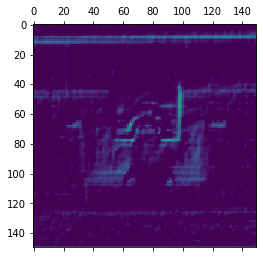

In [165]:
first_layer_activation = activations[0]
plt.matshow(first_layer_activation[0, :, :, 3], cmap='viridis')
plt.show()

In [ ]:
model.summary()

Exception ignored in: <function BaseSession._Callable.__del__ at 0x0000026F40893168>
Traceback (most recent call last):
  File "C:\Python\Python37\lib\site-packages\tensorflow\python\client\session.py", line 1473, in __del__
    self._session._session, self._handle)
tensorflow.python.framework.errors_impl.CancelledError: (None, None, 'Session has been closed.')


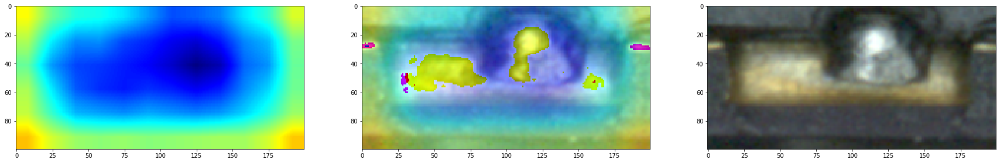

Exception ignored in: <function BaseSession._Callable.__del__ at 0x0000026F40893168>
Traceback (most recent call last):
  File "C:\Python\Python37\lib\site-packages\tensorflow\python\client\session.py", line 1473, in __del__
    self._session._session, self._handle)
tensorflow.python.framework.errors_impl.CancelledError: (None, None, 'Session has been closed.')


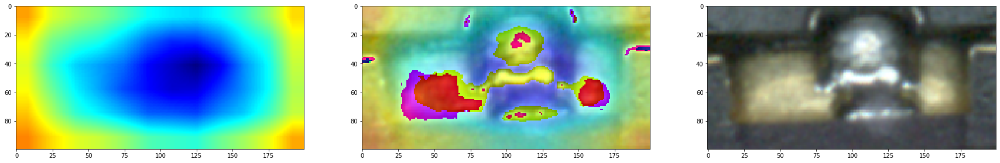

Exception ignored in: <function BaseSession._Callable.__del__ at 0x0000026F40893168>
Traceback (most recent call last):
  File "C:\Python\Python37\lib\site-packages\tensorflow\python\client\session.py", line 1473, in __del__
    self._session._session, self._handle)
tensorflow.python.framework.errors_impl.CancelledError: (None, None, 'Session has been closed.')


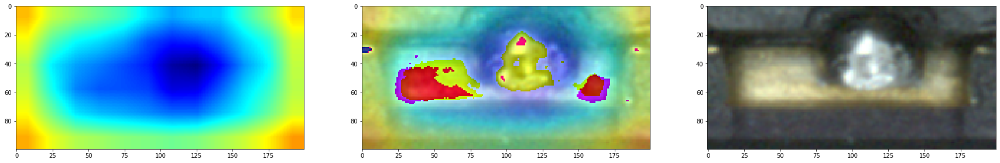

Exception ignored in: <function BaseSession._Callable.__del__ at 0x0000026F40893168>
Traceback (most recent call last):
  File "C:\Python\Python37\lib\site-packages\tensorflow\python\client\session.py", line 1473, in __del__
    self._session._session, self._handle)
tensorflow.python.framework.errors_impl.CancelledError: (None, None, 'Session has been closed.')


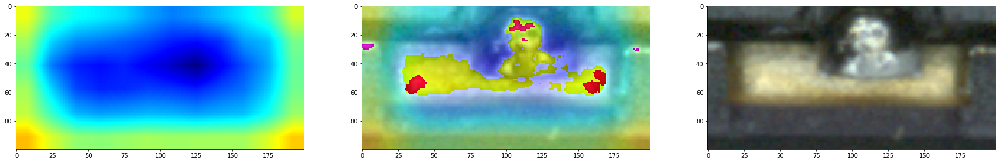

Exception ignored in: <function BaseSession._Callable.__del__ at 0x0000026F40893168>
Traceback (most recent call last):
  File "C:\Python\Python37\lib\site-packages\tensorflow\python\client\session.py", line 1473, in __del__
    self._session._session, self._handle)
tensorflow.python.framework.errors_impl.CancelledError: (None, None, 'Session has been closed.')


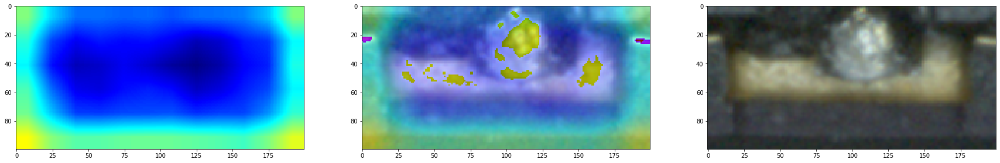

In [39]:
from keras.applications.vgg16 import preprocess_input, decode_predictions
from keras import backend as K

#img_path = img_up_ok_det[0][2]
#img = image.load_img(img_path,target_size = (218, 218))
# img = img_up_ok_det[2]
# x1 = image.img_to_array(img)
# x1 = np.expand_dims(x1,axis=0)
# x1 = preprocess_input(x1)


import tensorflow as tf


for i in range(0,5):
    img = img_up_ng_det[i]
    #img = img_up_ok_det[i]
    #img = up_ng[i]
    #img = cv2.cvtColor(img1.copy(), cv2.COLOR_HSV2RGB)
    x1 = image.img_to_array(img.copy())
    x1 = np.expand_dims(x1,axis=0)
    x1 = preprocess_input(x1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())

        # 예측 벡터의 '아프리카 코끼리' 항목
        african_elephant_output = model.output[:, 0]

        # VGG16의 마지막 합성곱 층인 block5_conv3 층의 특성 맵
        last_conv_layer = model.get_layer('block5_conv3')

        # block5_conv3의 특성 맵 출력에 대한 '아프리카 코끼리' 클래스의 그래디언트
        grads = K.gradients(african_elephant_output, last_conv_layer.output)[0]

        # 특성 맵 채널별 그래디언트 평균 값이 담긴 (512,) 크기의 벡터
        pooled_grads = K.mean(grads, axis=(0, 1, 2))

        # 샘플 이미지가 주어졌을 때 방금 전 정의한 pooled_grads와 block5_conv3의 특성 맵 출력을 구합니다
        iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

        # 두 마리 코끼리가 있는 샘플 이미지를 주입하고 두 개의 넘파이 배열을 얻습니다
        pooled_grads_value, conv_layer_output_value = iterate([x1])

        # "아프리카 코끼리" 클래스에 대한 "채널의 중요도"를 특성 맵 배열의 채널에 곱합니다
        for i in range(256):
            conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

        # 만들어진 특성 맵에서 채널 축을 따라 평균한 값이 클래스 활성화의 히트맵입니다
        heatmap = np.mean(conv_layer_output_value, axis=-1)

    heatmap = np.maximum(heatmap,0)
    heatmap /= np.max(heatmap)
#     plt.matshow(heatmap)
#     plt.show()

    #img1 = img_up_ok_det[0]
    # heatmap을 원본 이미지 크기에 맞게 변경
    #heatmap = cv2.resize(heatmap, (img_up_ok_det[0].shape[1], img_up_ok_det[0].shape[0]))
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    # heatmap을 RGB 포맷으로 변환
    heatmap = np.uint8(255 * heatmap)
    # 히트맵으로 변환
    heatmap_1 = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    #heatmap_1[np.where(heatmap < 110)] = 0
    # 0.4는 히트맵의 강도
    superimposed_img = (heatmap_1*0.5) + img
    plt.figure(figsize=(30,10))
    plt.subplot(1,3,1)
    plt.imshow(heatmap_1)
    plt.subplot(1,3,2)
    plt.imshow((superimposed_img).astype(np.uint8))
    plt.subplot(1,3,3)
    plt.imshow(img)
    plt.show()




In [ ]:
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# 특성 맵을 그립니다
for layer_name, layer_activation in zip(layer_names, activations):
    # 특성 맵에 있는 특성의 수
    n_features = layer_activation.shape[-1]

    # 특성 맵의 크기는 (1, size, size, n_features)입니다
    size = layer_activation.shape[1]

    # 활성화 채널을 위한 그리드 크기를 구합니다
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # 각 활성화를 하나의 큰 그리드에 채웁니다
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # 그래프로 나타내기 좋게 특성을 처리합니다
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # 그리드를 출력합니다
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()